In [1]:
import os, sys
repo_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if repo_root not in sys.path:
    sys.path.insert(0, repo_root)

from metrics import Node, populate

In [2]:
# make graph nodes
from llmdap.metadata_schemas.taxonomy_traverser import AI_TAXONOMY
root = Node(None, 'AI Taxonomy')
populate(root, AI_TAXONOMY)
root.set_depth(-1)



In [3]:
# load pipeline outputs for analyse
import os
import pandas as pd
all_dfs = {}
for file in os.listdir("../output_labels"):
    df = pd.read_csv("../output_labels/"+file, index_col=0)
    all_dfs[file[:-15]] = df
    df["date"] = pd.to_datetime(df["date"])
    df["predicted_tag"] = df["predicted_tag"].astype(str)


In [4]:
if 0: # add test case
    test1 = pd.DataFrame(index = df.index[:5])
    test1["date"] = df["date"][:5]
    test1["predicted_tag"] = [
        "['Model architecture', 'AI problem type', 'Computer vision', 'Learning paradigm', 'Application domain']",
        "['Model architecture', 'Neural/deep learning architectures', 'Convolutional networks', 'Diffusion UNets', 'AI problem type', 'Computer vision', 'Text-to-image generation', 'Learning paradigm', 'Application domain']",
        "['Model architecture', 'Neural/deep learning architectures', 'Convolutional networks', 'Diffusion UNets', 'AI problem type', 'Computer vision', 'Text-to-image generation', 'Learning paradigm', 'Application domain']",
        "['Model architecture', 'Neural/deep learning architectures', 'Convolutional networks', 'Diffusion UNets', 'AI problem type', 'Computer vision', 'Text-to-image generation', 'Learning paradigm', 'Not relevant', 'Application domain', 'AI_infrastructure_and_tooling', 'Infrastructure_and_scaling', 'Inference optimization']",
        "['Model architecture', 'Neural/deep learning architectures', 'Convolutional networks', 'Diffusion UNets', 'AI problem type', 'Computer vision', 'Text-to-image generation', 'Learning paradigm', 'Not relevant', 'Application domain', 'AI_infrastructure_and_tooling', 'Infrastructure_and_scaling', 'Inference optimization']",
    ]
    all_dfs["test1"] = test1


In [5]:
# Force set df for root node (sinc its label is not in the dfs.)
root.dfs = all_dfs
for child in root.children:
    child.set_dfs(all_dfs)

/Users/sondre/upcast/profile/metrics/__init__.py:28: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  self.dfs[key] = df[df["predicted_tag"].str.contains("'"+self.parent.label+"', '"+self.label+"'")] # Make sure its the ones where this branch is not relevant


In [6]:
# print all names and fractions (=popularities)

def name_and_sizes(node):
    return node.label + "\t"*2 + str([[key, len(node.dfs[key])] for key in ["arx_long", "hf", "dlw_long"]])


def fraction_printer(node):
    string = node.label + "\t\t"
    fractions = []
    for key in ["arx_long", "hf", "dlw_long"]:
        fraction = (100*len(node.dfs[key]))//len(all_dfs[key])
        fractions.append(fraction)
        string+= key+": "+str(fraction)+"   "
    #if sum(fractions)<30:
    #    raise StopIteration
    return string

#root.print_info(name_and_sizes)
#root.print_info(fraction_printer)


# fallof ratio = how many nodes are not in any subnodes
def falloff_ratio_printer(node):
    string = node.label + "\t\t"
    for key in ["arx_long", "hf", "dlw_long"]:
        l = len(node.dfs[key])
        for child in node.children:
            if child.label == "Not relevant":
                #print(child.label)
                l -= len(child.dfs[key]) # this should not count
        if l == 0:
            #print(node.label)
            falloff_ratio = 0
        else:
            falloff_ratio = (100*node.absolute_falloffs[key])//l
        string+= key+": "+str(falloff_ratio)+"   "
    return string

#root.print_info(falloff_ratio_printer)

In [7]:
root.get_max_depth()

6

# popularity

In [8]:
from metrics.popularity import calc_popularity
calc_popularity(root)

# detail depth

In [9]:
from metrics.detail_depth import calc_avg_depth

calc_avg_depth(root)

# diversity

In [10]:
from metrics.diversity import calc_diversity_score

calc_diversity_score(root)


In [11]:
def print_leaves(node):
    return str(node.number_of_leaves)
#root.print_info(print_leaves) # check its correct
def print_subtree_length(node):
    return str(node.subtree_length)
#root.print_info(print_subtree_length) # check its correct

# print nice

In [12]:
   
def add_tab(string, i):
    #if len(string)>i:
    #    print(i)
    #    raise ValueError
    string = string + " "*(i-len(string))
    return string

def print_fraction(node):
    string = "    "*1*max(0, node.depth-1)+"->  "*(node.depth>0)
    if "(" in node.label and ")" in node.label:
        string += node.label.split("(")[0] # remove paranteces to keep the list narrower
    else:
        string += node.label

    current_tab = 53
    spacing = 6
    short_spacing = 3


    string = add_tab(string, current_tab)
    string += "|"


    
    # fraction:
    fractions = []
    for key in ["arx_long", "hf", "dlw_long"]:
        fraction = node.popularity[key]
        fraction = int(100*fraction)
        fractions.append(fraction)
        add_string = str(fraction) if node.depth>0 else ""

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    #if sum(fractions)<15:
    if max(fractions)<10:
        return
    
    print(string)
    for child in node.children:
        print_fraction(child)


def print_avg_depth(node):

    #string = ">   "*1*node.depth
    string = "    "*1*max(0, node.depth-1)+"->  "*(node.depth>0)

    if "(" in node.label and ")" in node.label:
        string += node.label.split("(")[0] # remove paranteces to keep the list narrower
    else:
        string += node.label

    current_tab = 53
    spacing = 6
    short_spacing = 3


    string = add_tab(string, current_tab)
    string += "|"


    # avg depth
    lens = []
    for key in ["arx_long", "hf", "dlw_long"]:#, "test1"]:
        if len(node.dfs[key]) < 5:
            avg_depth = ""
        else:
            avg_depth = int(100*node.avg_depth[key])
        lens.append(len(node.dfs[key]))
        add_string = str(avg_depth)

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    if sum(lens) < 600:
        return
    if len(node.children) == 0:# dont print leaf nodes
        return

    
    print(string)
    for child in node.children:
        print_avg_depth(child)

def print_diversity(node):
    #string = ">   "*1*node.depth
    string = "   "*1*max(0, node.depth-1)+"-> "*(node.depth>0)
    if "(" in node.label and ")" in node.label:
        string += node.label.split("(")[0] # remove paranteces to keep the list narrower
    else:
        string += node.label

    current_tab = 49
    spacing = 6
    short_spacing = 3


    string = add_tab(string, current_tab)
    string += "|"
    
    # fraction:
    fractions = []
    for key in ["arx_long", "hf", "dlw_long"]:
        fraction = (100*len(node.dfs[key]))//len(all_dfs[key])
        #fraction = len(node.dfs[key])
        fractions.append(fraction)
        add_string = str(fraction)

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    spacing = 5


    # avg depth
    lens = []
    scores = []
    for key in ["arx_long", "hf", "dlw_long"]:
        #if len(node.dfs[key]) < 5:
        #    score = ""
        #else:
        if 1:
            score = int(100*node.diversity_score[key])
            scores.append(score)

        
        fraction = (100*len(node.dfs[key]))//len(all_dfs[key])
        lens.append(len(node.dfs[key]))


        add_string = str(score)

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    #if len(node.children) == 0: # dont print leaf nodes
    #    return

    if sum(fractions)<15:
        return
    #if max(fractions)<10:
    #    return


    #if len(scores)>1: # to find largest diffs
    #    string += "-"*((max(scores)-min(scores))//10)
    
    print(string)
    for child in node.children:
        print_diversity(child)
    
print_fraction(root)
print("\n")
print_avg_depth(root)
print("\n")
print_diversity(root)

AI Taxonomy                                          |                   |
Model architecture                                   |                   |
->  Not relevant                                     |   24     1    16  |
->  Neural/deep learning architectures               |   70    96    82  |
    ->  Feed-forward networks                        |    3    14     8  |
        ->  Multilayer perceptrons                   |    2    13     8  |
    ->  Convolutional networks                       |   20     9    14  |
    ->  Sequence models                              |   23    55    31  |
        ->  Recurrent neural networks                |   10    10    11  |
        ->  Transformer architectures                |    9    45    18  |
            ->  Encoder-decoder transformers         |    3    21     5  |
            ->  Encoder-only transformers            |    0    14     1  |
                ->  BERT                             |    0    13     1  |
AI problem type          

# nonuniformity

In [13]:
def make_plot(node, plot_fnc):
    try:
        plot_fnc(node)
    except StopIteration:
        return
    for child in node.children:
        make_plot(child, plot_fnc)

In [14]:
from matplotlib import pyplot as plt   

def plot_nonuniformity(node,
                     keys=("arx_long", "hf", "dlw_long")):
    
    if not hasattr(node, "nonuniformity_scores"):
        raise StopIteration

    fig, axes = plt.subplots(1, 1)#, figsize=(6, 4))
    ax_p = axes#.ravel()

    COLORS = {"arx_long":"#1f77b4", "hf":"#ff7f0e", "dlw_long":"#949827"}

    all_insignificant = True

    for key in keys:
        if key in node.nonuniformity_plot_x and len(node.nonuniformity_plot_x[key]):
            ax_p.plot(node.nonuniformity_plot_x[key], node.nonuniformity_plot_y[key], label=f"{key}:{len(df)}", color = COLORS[key])
            if max(node.nonuniformity_plot_y[key]) > 1: # p < 0.1 for some window size
                all_insignificant = False


    if all_insignificant:
        plt.close(fig)
        return # avoid plotting but keep traversing branch

    # Cosmetics


    ax_p.set_title(node.label)
    ax_p.set_xlabel("Window size (months)")
    ax_p.set_ylabel(r"$-\log_{10} p$")


    for ax in (ax_p,):
        #ax.legend()
        ax.grid(True, alpha=0.3)

    #fig.suptitle(node.label)
    plt.tight_layout()
    #plt.savefig("../../../figs/"+node.label.replace(" ", "_").replace("/","__")+"___tempsign.pdf")
    plt.show()


In [15]:
from metrics.nonuniformity import calc_nonuniformity
calc_nonuniformity(root)

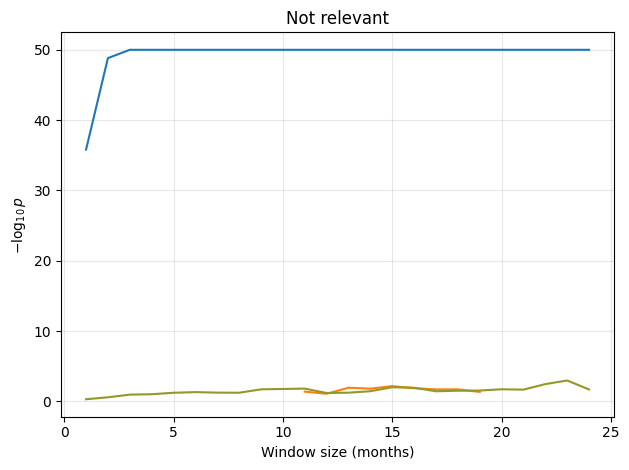

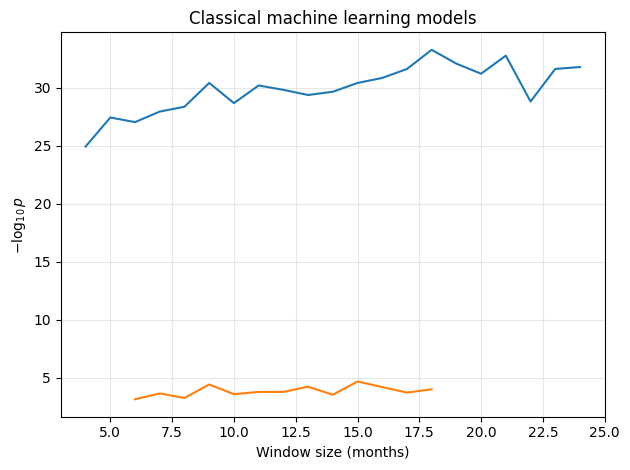

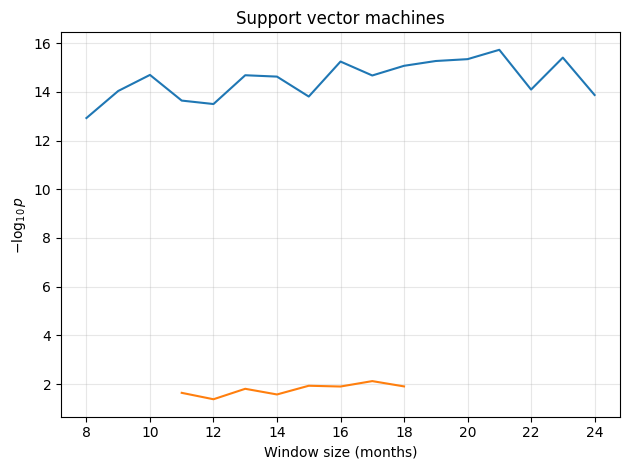

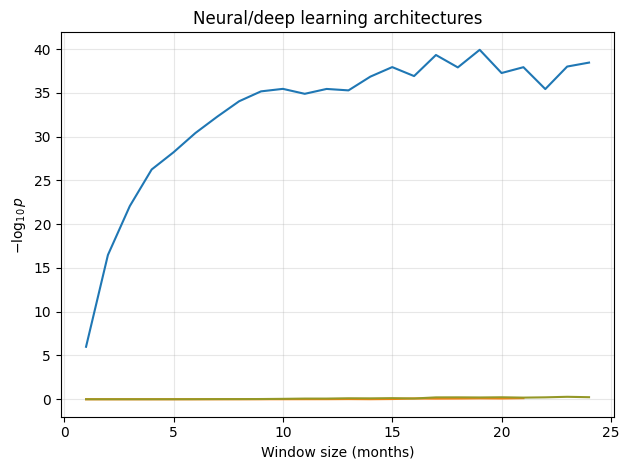

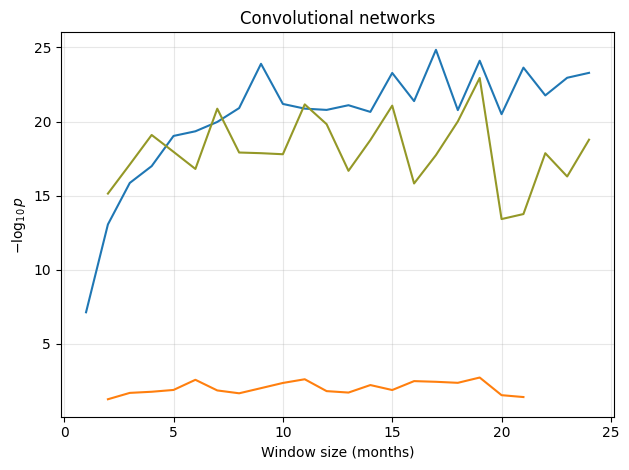

...

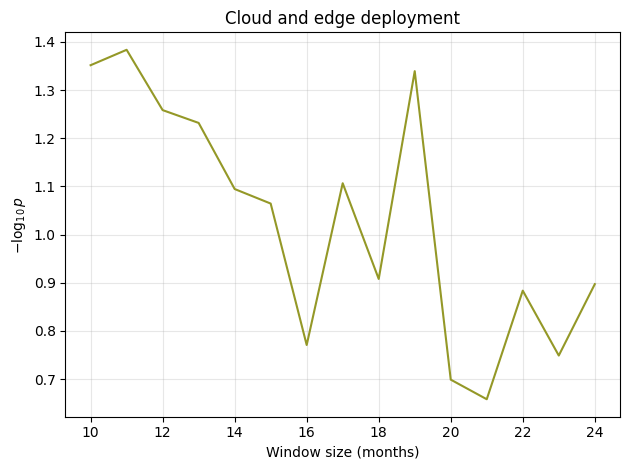

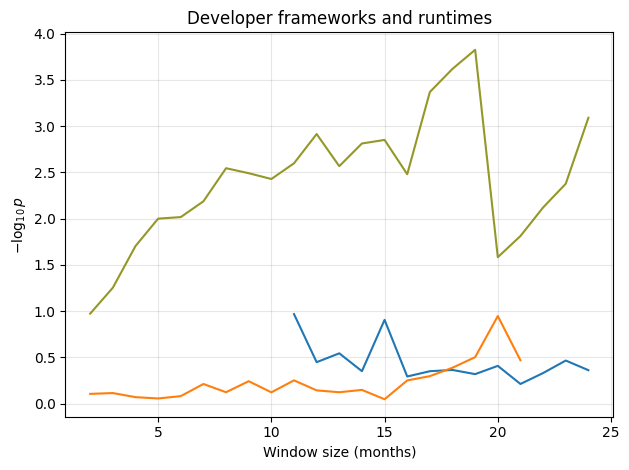

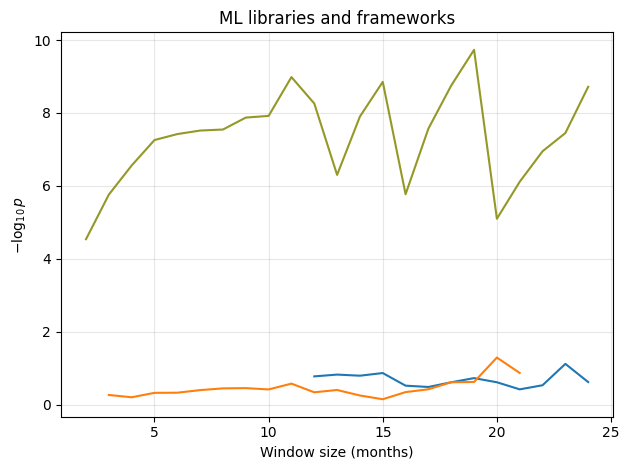

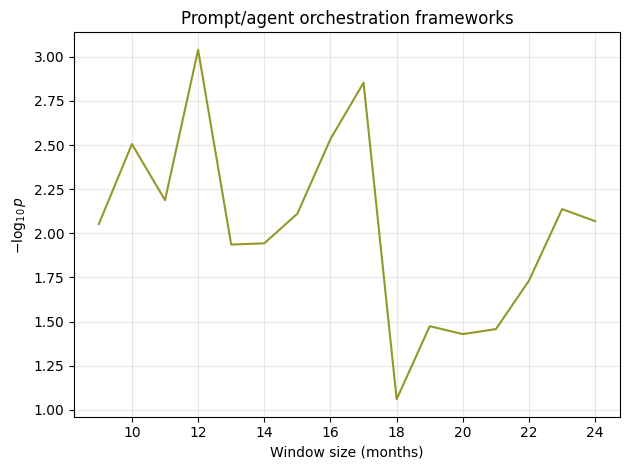

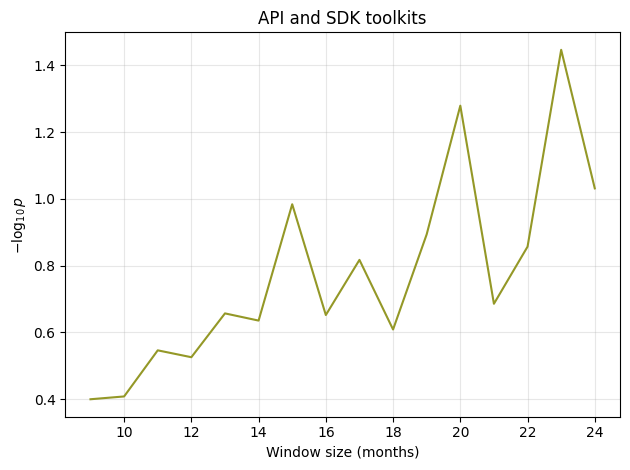

In [16]:
make_plot(root, plot_nonuniformity)


# temporal uniqueness

In [17]:

from metrics.uniqueness import calc_uniqueness

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    calc_uniqueness(root)


In [18]:
from matplotlib import pyplot as plt
    
def plot_uniqueness(node,
                                 keys=("arx_long","hf","dlw_long")
):
    fig, ax = plt.subplots(1, 1, figsize=(5, 4))
    ax_cat = ax


    skip_plot = True
    for key in keys:
        if hasattr(node, "uniqueness_x") and key in node.uniqueness_x:
            if max(node.uniqueness_y[key])>=2:
                skip_plot = False
            ax_cat.plot(node.uniqueness_x[key], node.uniqueness_y[key], label=f"{key}")
    
    if skip_plot:
        plt.close(fig)
        print("SKIPPING", node.label)
        return # no significant result


    ax_cat.set_title("Poisson GLM (categorical bins; one-vs-rest)")
    ax_cat.set_xlabel("Window size (months)")
    ax_cat.set_ylabel(r"$-\log_{10} p$")


    for ax in (ax_cat,):
        ax.grid(True, alpha=0.3)
        ax.legend()

    fig.suptitle(getattr(node, "label", ""))
    plt.tight_layout()
    plt.show()


SKIPPING AI Taxonomy
SKIPPING Model architecture


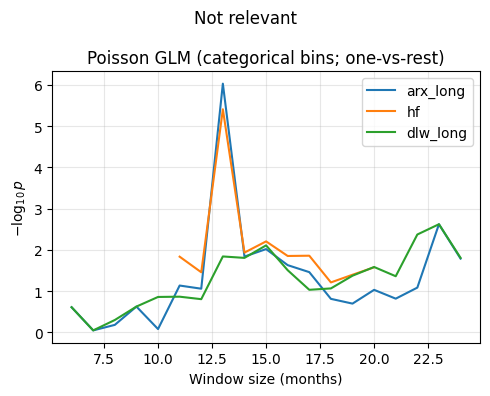

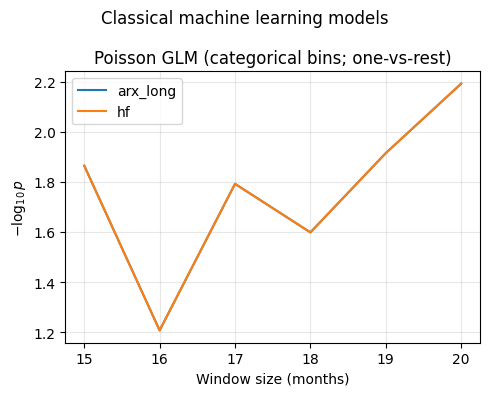

SKIPPING Linear regression
SKIPPING Logistic regression
SKIPPING Decision trees
SKIPPING Random forests
SKIPPING Gradient boosting
SKIPPING Support vector machines
SKIPPING Neural/deep learning architectures


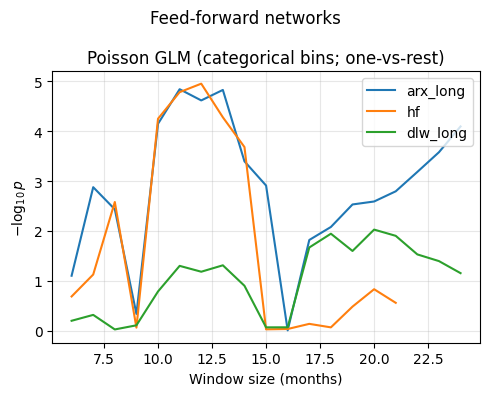

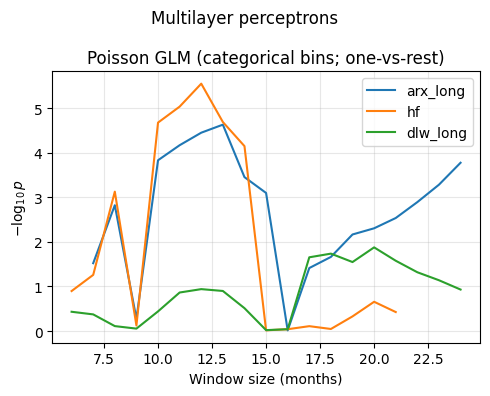

SKIPPING Autoencoders


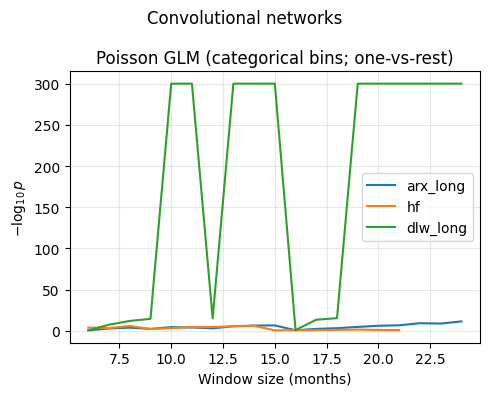

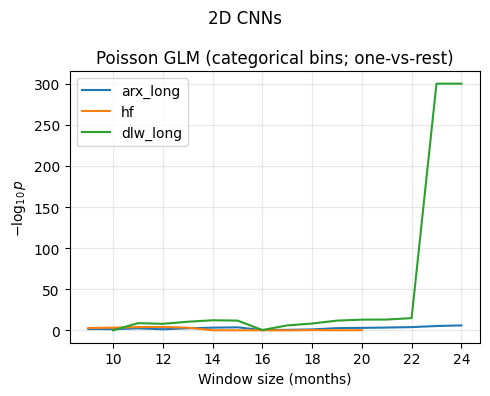

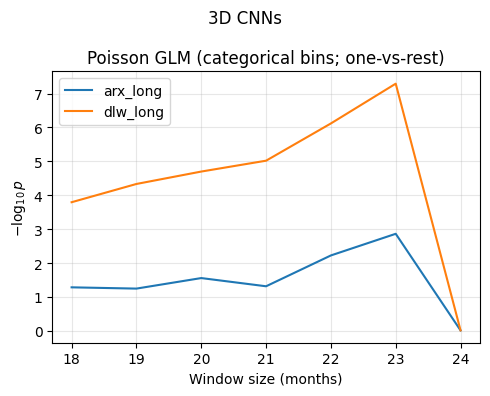

SKIPPING Convolutional autoencoders


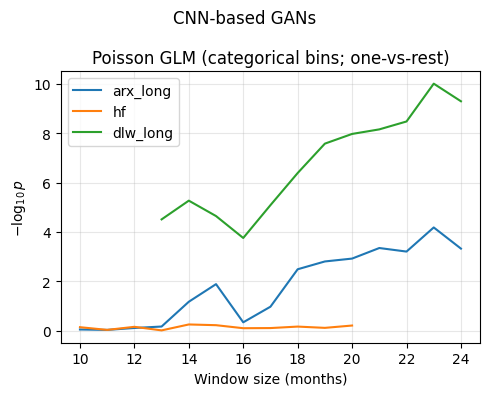

SKIPPING Diffusion UNets


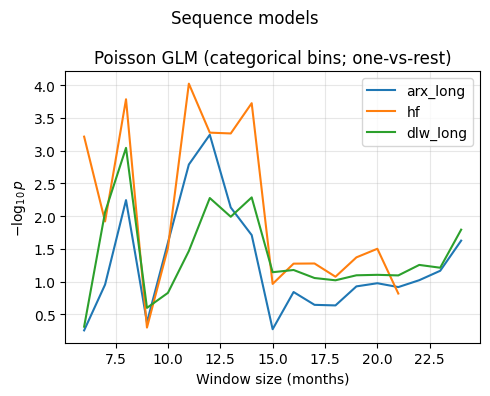

SKIPPING Recurrent neural networks
SKIPPING Vanilla RNN
SKIPPING Long short-term memory (LSTM)
SKIPPING Gated recurrent unit (GRU)


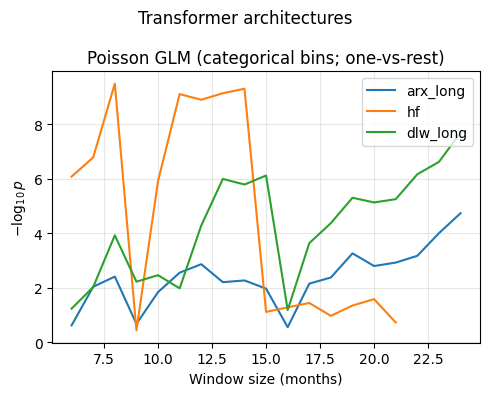

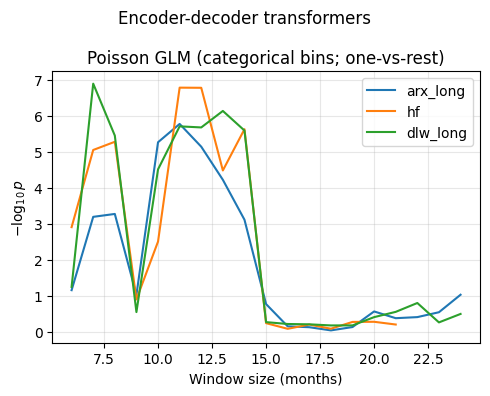

SKIPPING Decoder-only transformers


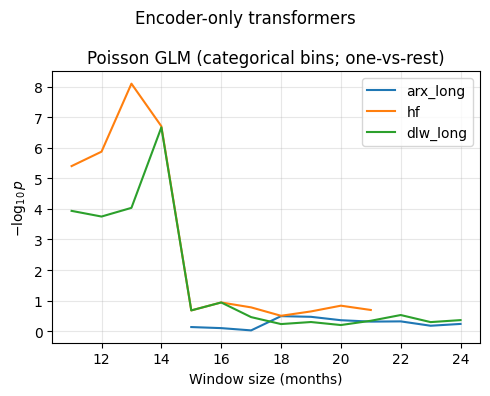

SKIPPING BERT
SKIPPING Vision transformers
SKIPPING Audio encoders
SKIPPING Sparse attention transformers
SKIPPING Long-context transformers
SKIPPING Low-rank / structured attention
SKIPPING Mixture-of-experts transformers


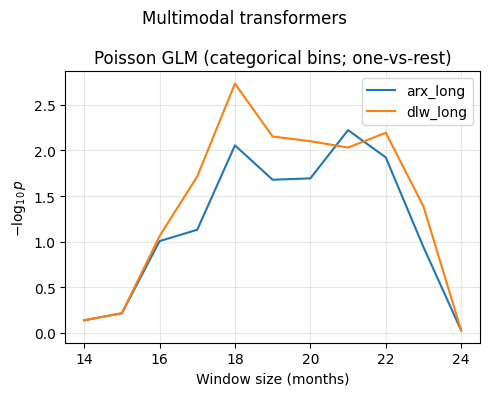

SKIPPING Vision-language transformers
SKIPPING Speech-text transformers
SKIPPING Video-text transformers
SKIPPING Variational transformers
SKIPPING Diffusion transformers
SKIPPING Adversarial transformers
SKIPPING Temporal CNNs
SKIPPING State-space models


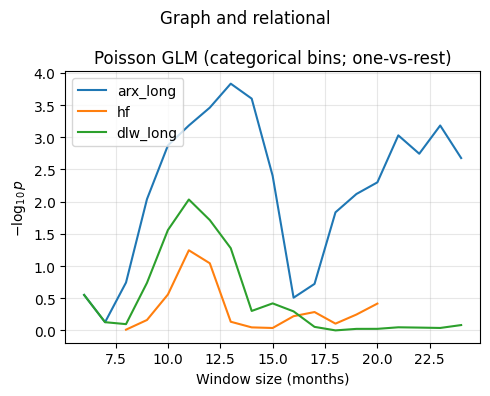

SKIPPING Graph neural networks
SKIPPING Graph transformers
SKIPPING Relational reasoning networks
SKIPPING Graph diffusion models
SKIPPING Graph VAEs
SKIPPING Graph GANs


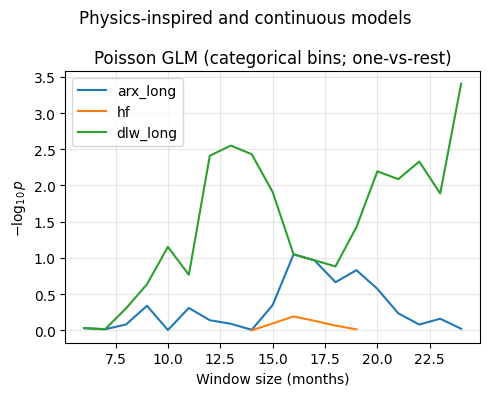

SKIPPING Neural ODEs
SKIPPING Hamiltonian neural networks
SKIPPING Physics-informed neural networks


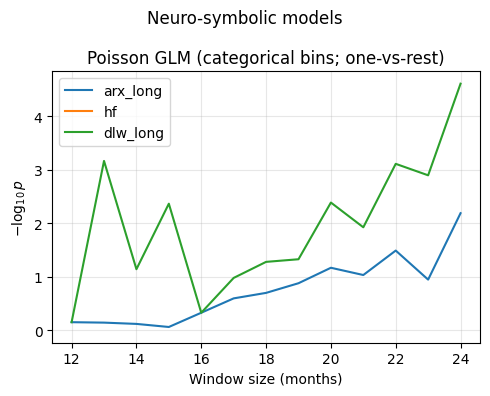

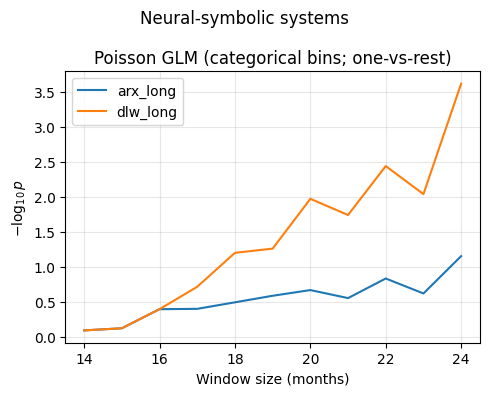

SKIPPING Differentiable logic layers
SKIPPING AI problem type


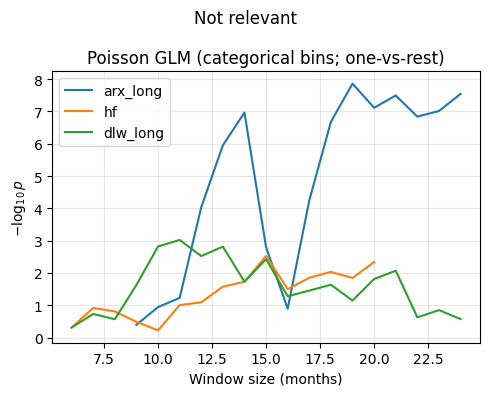

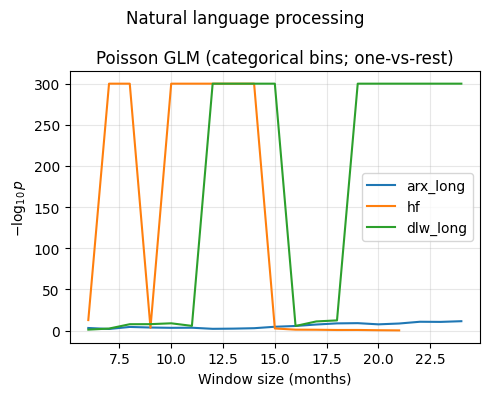

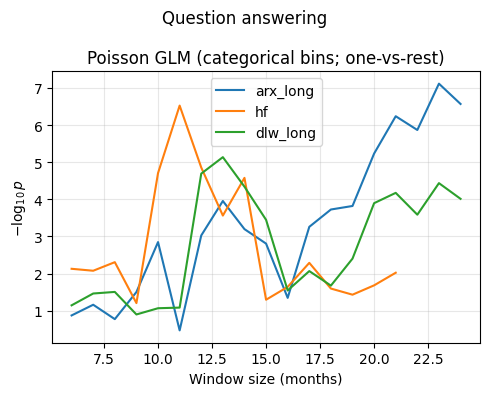

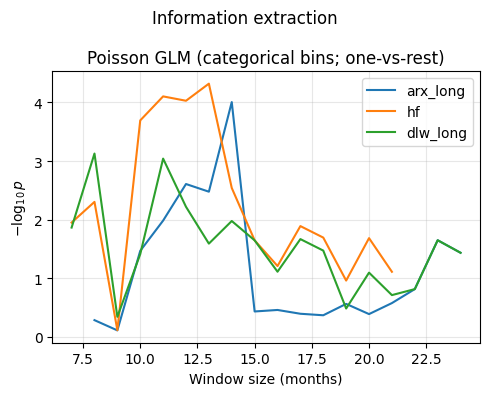

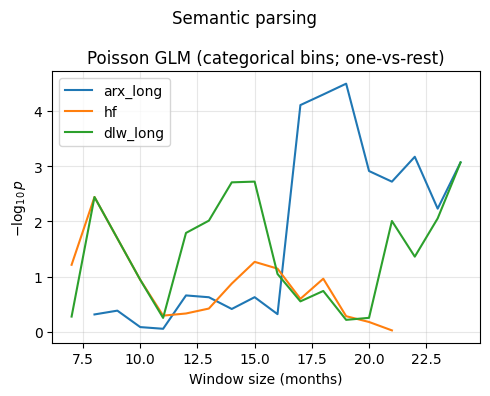

SKIPPING Commonsense reasoning
SKIPPING Machine translation
SKIPPING Summarization
SKIPPING Dialogue systems
SKIPPING Human-AI co-writing


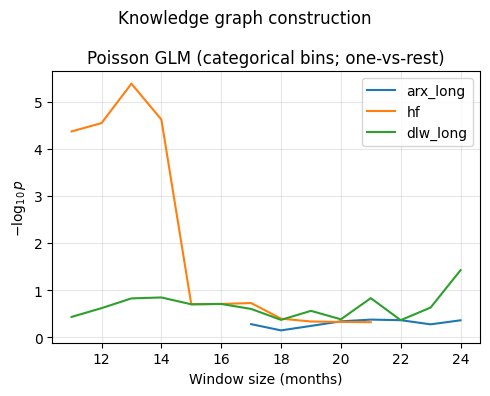

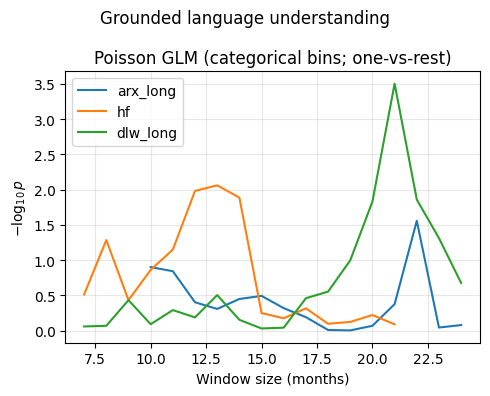

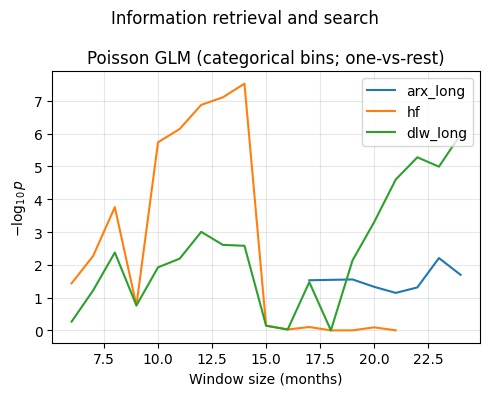

SKIPPING Retrieval-augmented generation


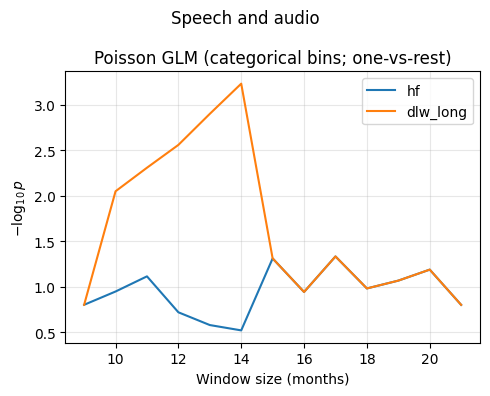

SKIPPING Speech recognition
SKIPPING Speech synthesis
SKIPPING Speaker diarization
SKIPPING Audio event detection
SKIPPING Music understanding
SKIPPING Audio/music generation


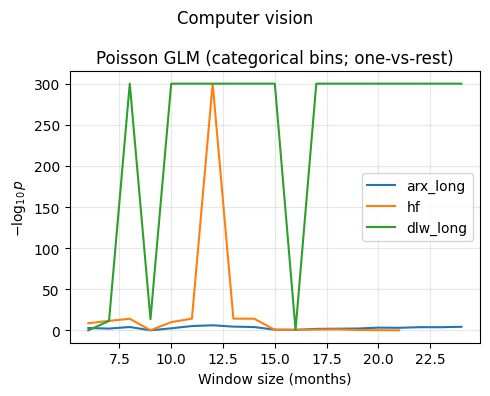

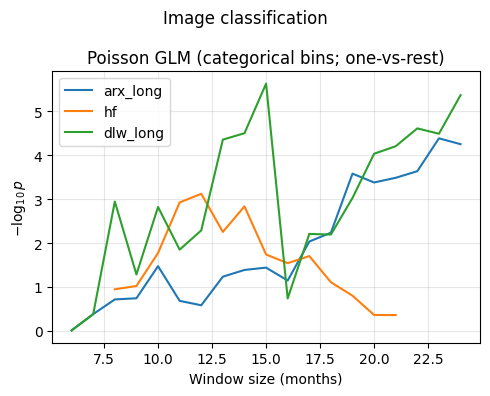

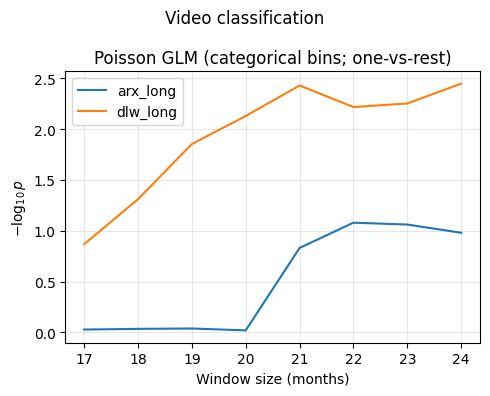

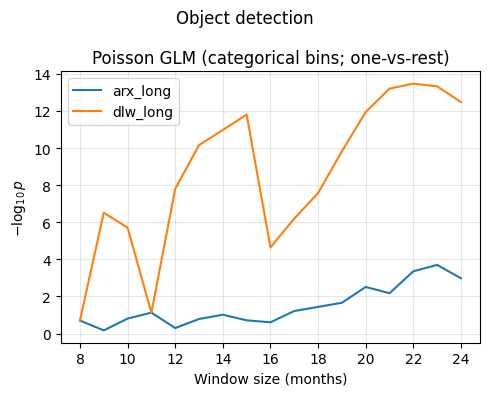

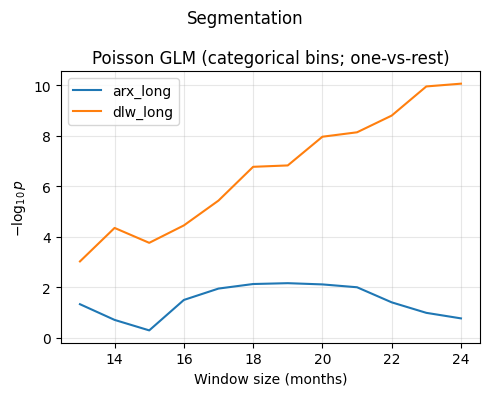

SKIPPING Pose estimation
SKIPPING Tracking


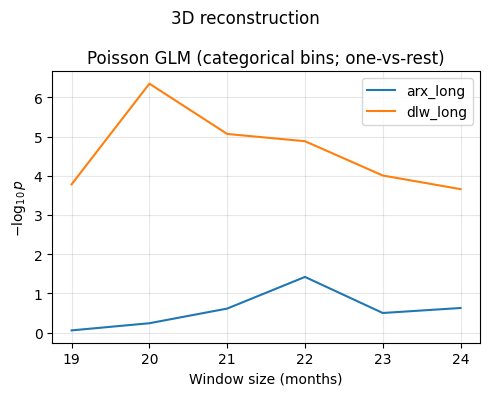

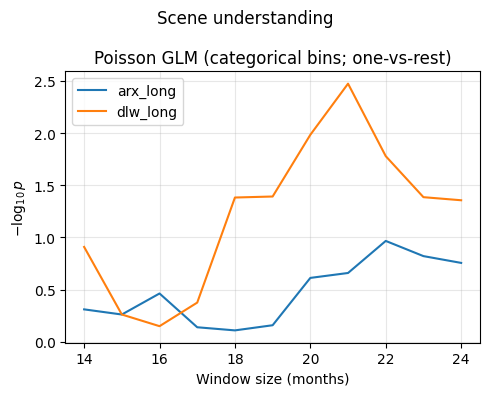

SKIPPING Simultaneous localization and mapping


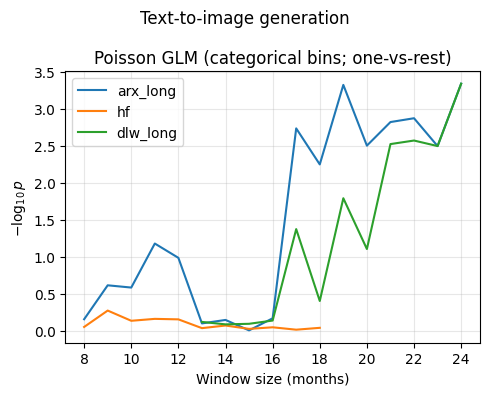

SKIPPING Image-to-image translation
SKIPPING Video generation
SKIPPING Neural rendering


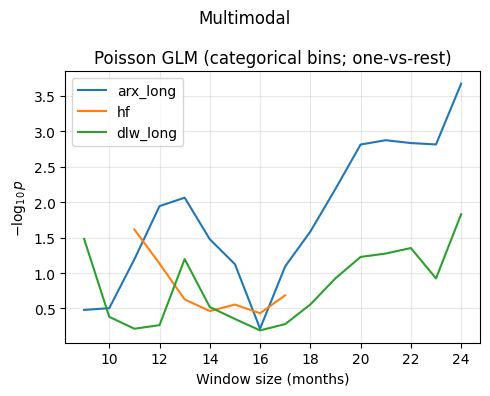

SKIPPING Vision-language understanding
SKIPPING Audio-visual learning
SKIPPING Cross-modal retrieval
SKIPPING Multimodal generation
SKIPPING Recommendation and personalization
SKIPPING Recommender systems
SKIPPING Learning-to-rank
SKIPPING Contextual bandits for recommendations


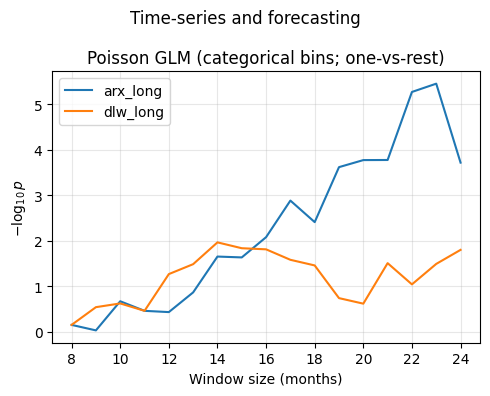

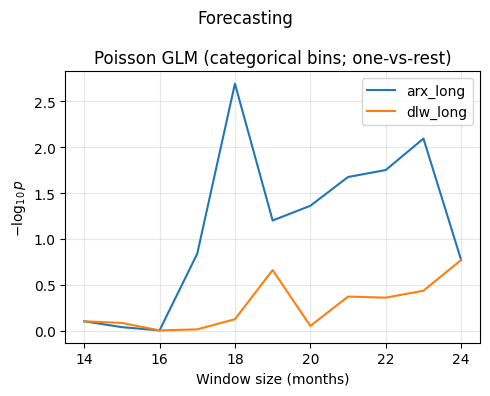

SKIPPING Anomaly detection
SKIPPING Event prediction
SKIPPING Demand and energy forecasting
SKIPPING Financial forecasting


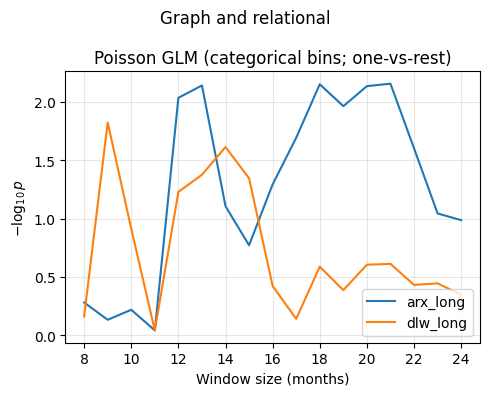

SKIPPING Node/edge/graph prediction
SKIPPING Link prediction
SKIPPING Community detection
SKIPPING Graph clustering


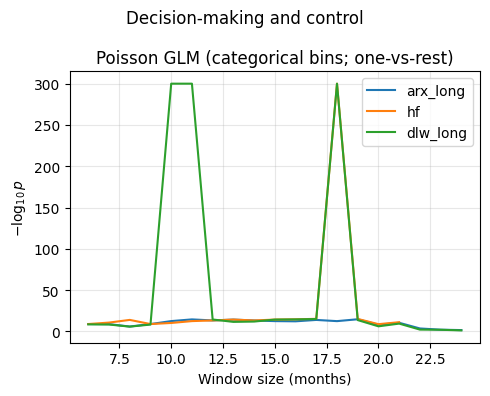

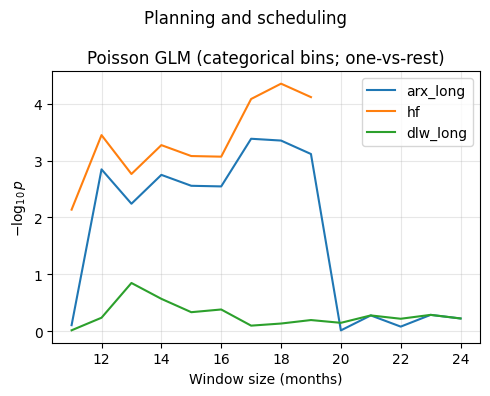

SKIPPING Robot manipulation


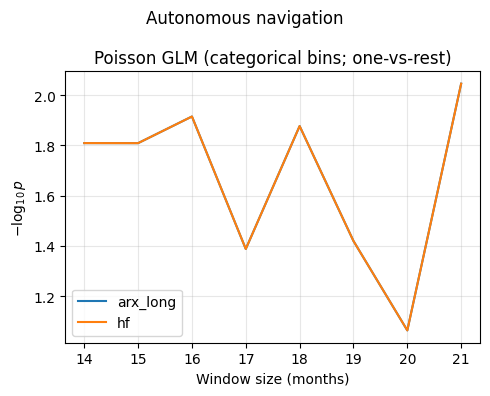

SKIPPING Human-robot interaction
SKIPPING Sim-to-real transfer


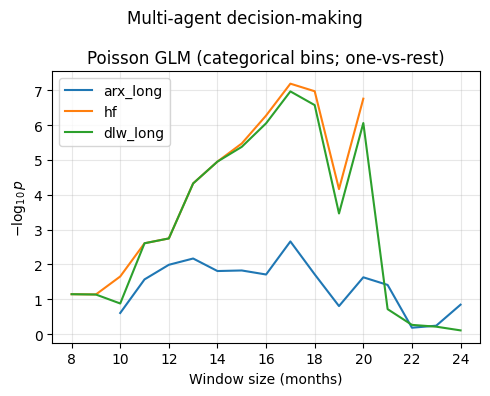

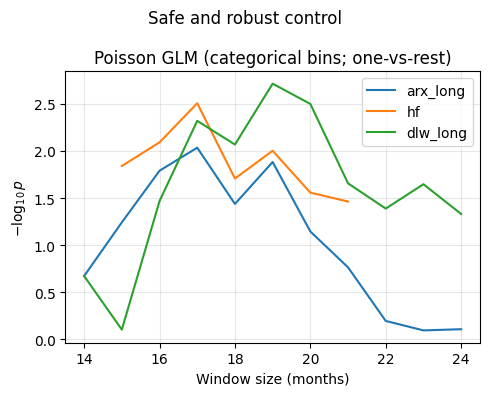

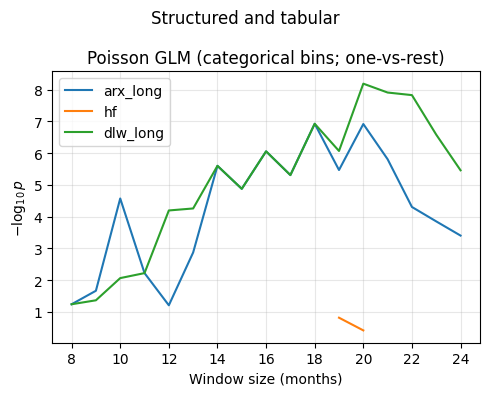

SKIPPING Classification
SKIPPING Regression
SKIPPING Survival analysis
SKIPPING Risk scoring
SKIPPING Learning paradigm


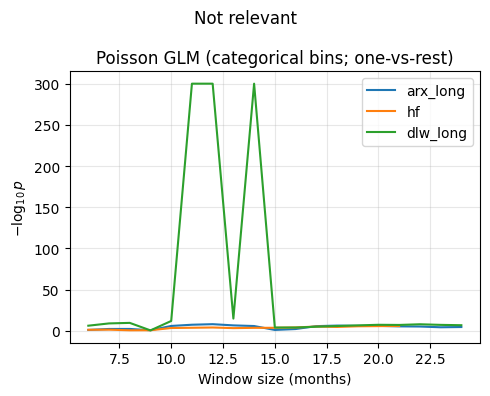

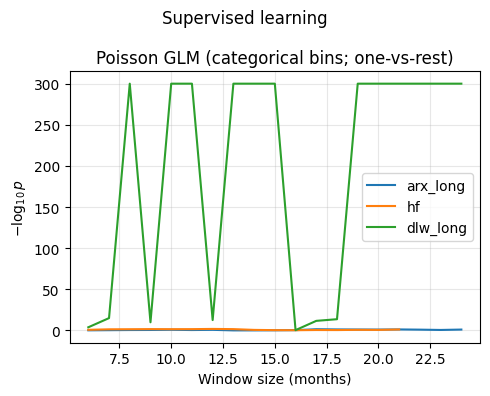

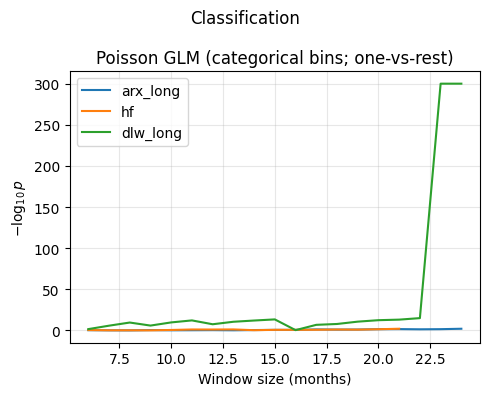

SKIPPING Binary classification


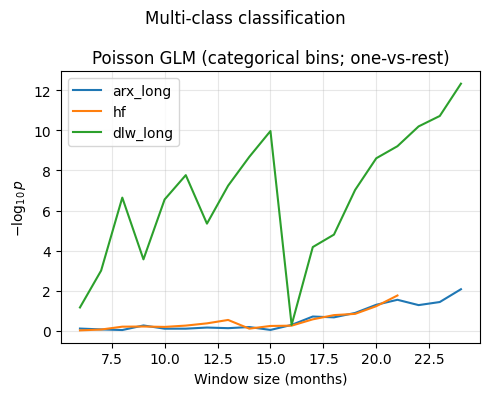

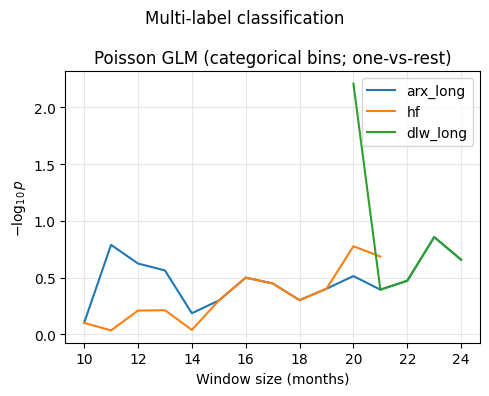

SKIPPING Hierarchical classification


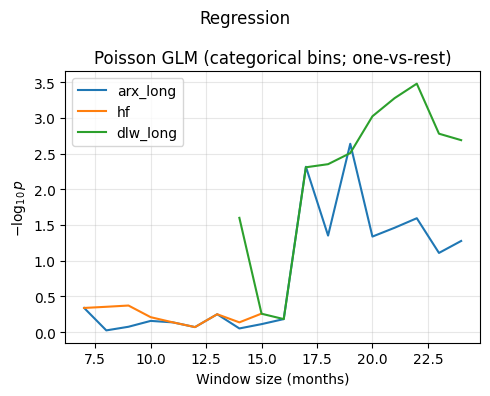

SKIPPING Single-output regression
SKIPPING Multi-output regression
SKIPPING Ordinal regression
SKIPPING Ranking


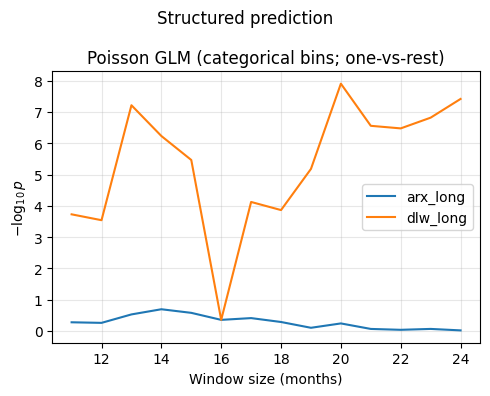

SKIPPING Sequence labeling
SKIPPING Imbalanced learning
SKIPPING Cost-sensitive learning


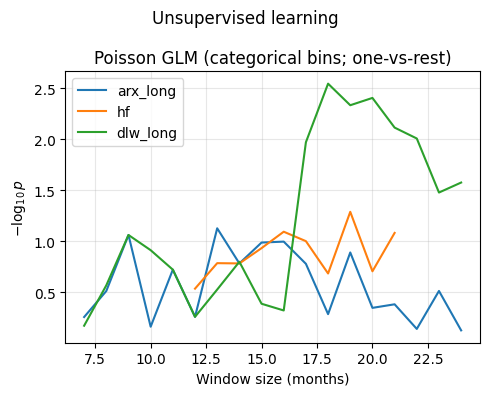

SKIPPING Contrastive learning
SKIPPING Masked modeling


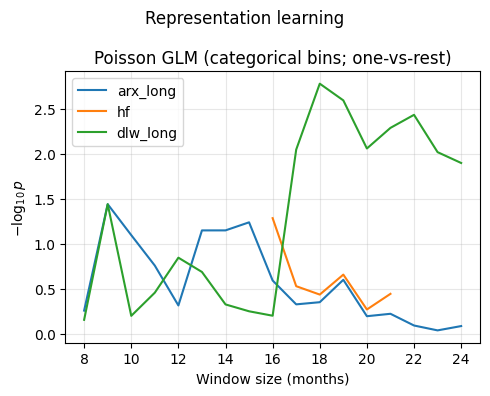

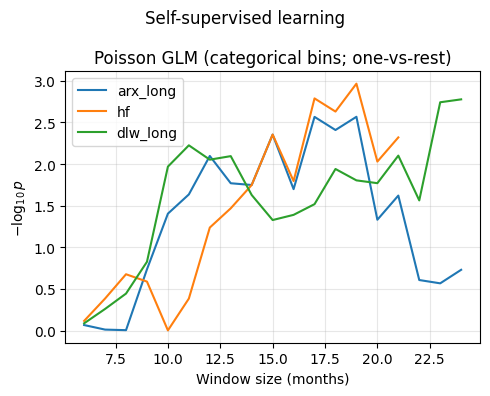

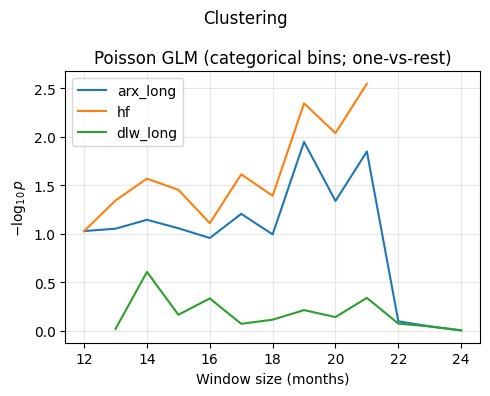

SKIPPING Density estimation
SKIPPING Dimensionality reduction


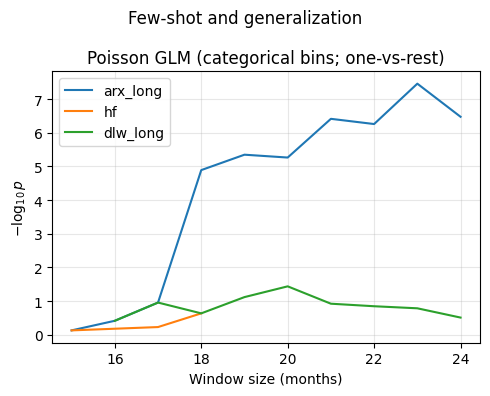

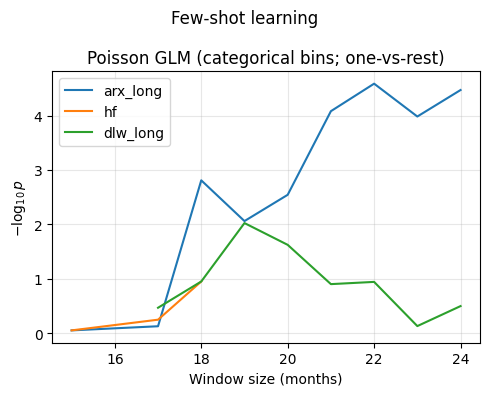

SKIPPING Zero-shot learning
SKIPPING Prompt-based adaptation
SKIPPING Meta-learning


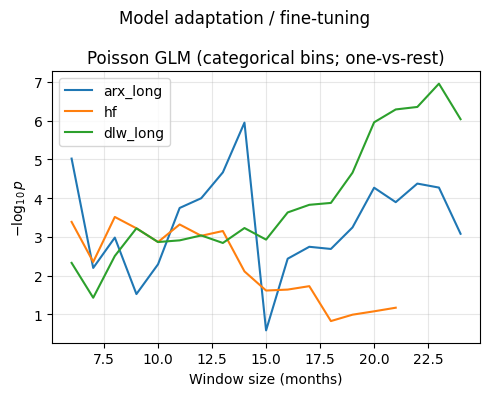

SKIPPING Full-parameter fine-tuning


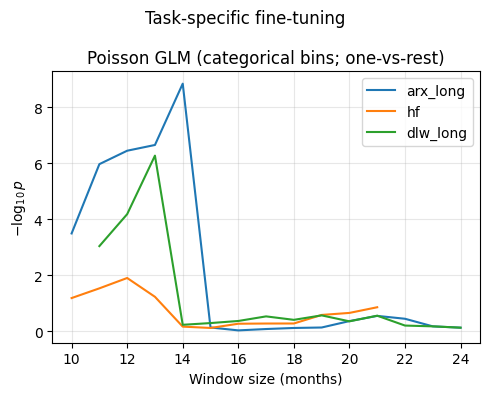

SKIPPING Domain adaptation fine-tuning
SKIPPING Continual fine-tuning
SKIPPING Parameter-efficient tuning
SKIPPING Adapter-based tuning
SKIPPING Low-rank adaptation (LoRA)
SKIPPING Prefix / prompt tuning
SKIPPING BitFit and bias-only tuning
SKIPPING Knowledge distillation


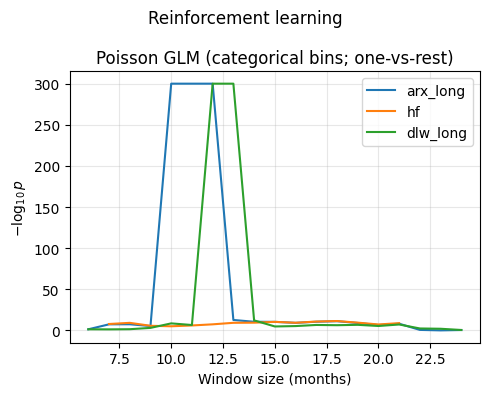

SKIPPING Model-based RL
SKIPPING Model-free RL
SKIPPING Offline RL
SKIPPING Multi-agent RL
SKIPPING Exploration strategies
SKIPPING Safe RL
SKIPPING Human feedback and alignment
SKIPPING Reinforcement learning from human feedback
SKIPPING Constitutional AI
SKIPPING Preference modeling
SKIPPING Instruction tuning
SKIPPING Collaborative and secure
SKIPPING Federated learning
SKIPPING Differential privacy in ML
SKIPPING Secure multi-party learning
SKIPPING Continual and lifelong learning


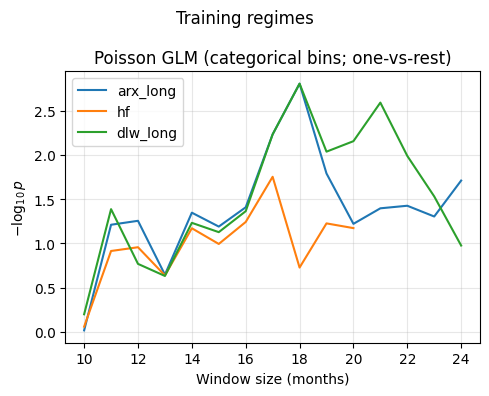

SKIPPING Curriculum learning
SKIPPING Self-paced learning
SKIPPING Hard example mining
SKIPPING Meta-ML and model selection
SKIPPING Hyperparameter optimization
SKIPPING AutoML (pipeline/search)
SKIPPING Neural architecture search
SKIPPING Application domain


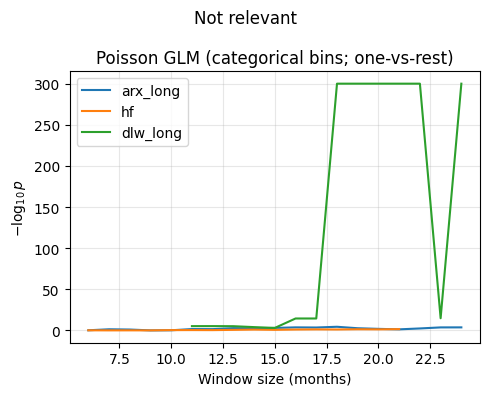

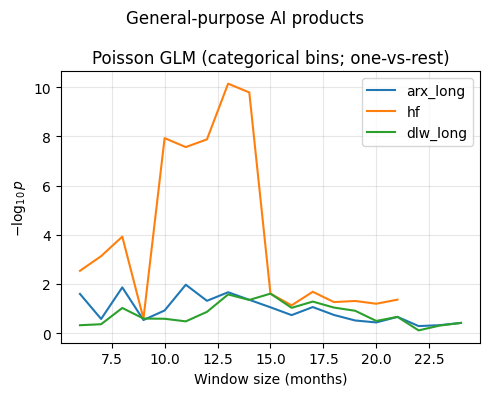

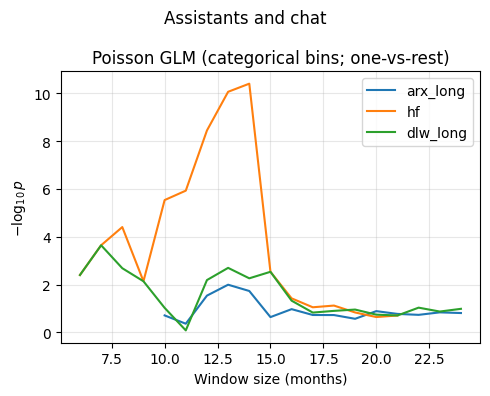

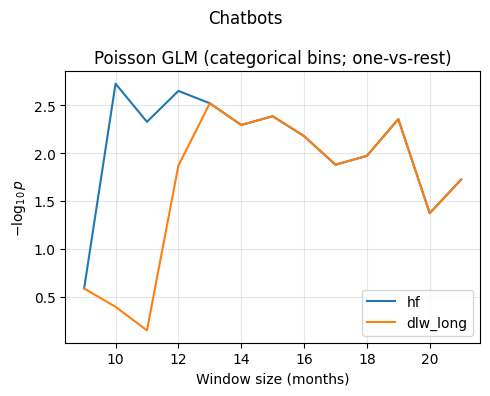

SKIPPING Open-domain/social chatbots
SKIPPING Task-oriented/transactional chatbots
SKIPPING Customer service chatbots
SKIPPING Domain-specific chatbots
SKIPPING Entertainment/roleplay chatbots
SKIPPING Research-oriented chatbots
SKIPPING Customer support assistants
SKIPPING Search assistants
SKIPPING Personal assistants
SKIPPING Knowledge management assistants
SKIPPING General-purpose computer-use agents
SKIPPING Browser automation agents
SKIPPING Desktop automation agents
SKIPPING Enterprise RPA-style agents
SKIPPING Developer/technical automation agents
SKIPPING Multi-app orchestration agents
SKIPPING Autonomous task loop agents
SKIPPING Productivity and office
SKIPPING Document summarization tools
SKIPPING Meeting assistants
SKIPPING Email drafting
SKIPPING Note-taking and transcription
SKIPPING Presentation/slide generation
SKIPPING Developer and coding tools
SKIPPING Code completion
SKIPPING Code explanation and refactoring
SKIPPING Bug detection
SKIPPING Test generation
SKIPPING 

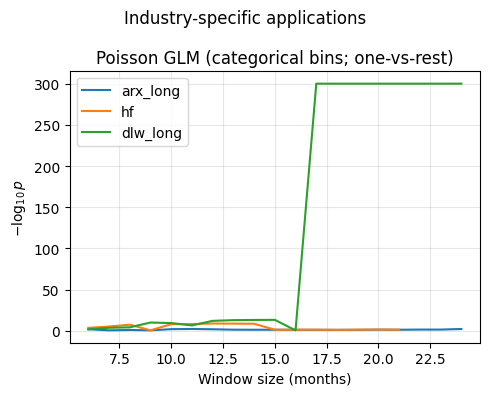

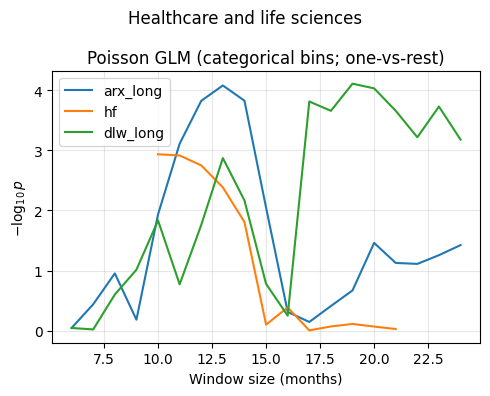

SKIPPING Healthcare
SKIPPING Clinical care and hospital operations
SKIPPING Medical imaging
SKIPPING Electronic health records
SKIPPING Public health and epidemiology


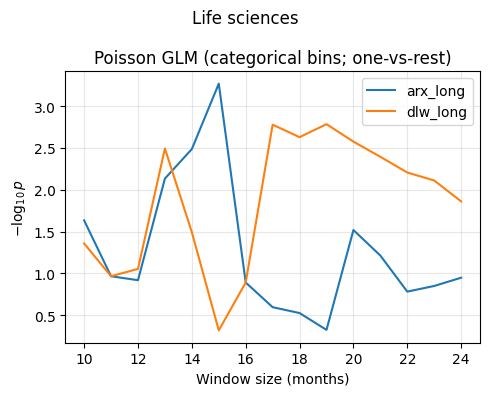

SKIPPING Drug discovery
SKIPPING Biotechnology
SKIPPING Genomics and proteomics
SKIPPING Finance, business and legal
SKIPPING Finance and fintech
SKIPPING Banking and payments
SKIPPING Insurance
SKIPPING Investment and trading
SKIPPING Risk and compliance
SKIPPING Legal and compliance
SKIPPING Legal practice
SKIPPING E-discovery
SKIPPING Contract management
SKIPPING Regulatory compliance
SKIPPING Business operations
SKIPPING Human resources
SKIPPING Marketing and advertising
SKIPPING Customer service


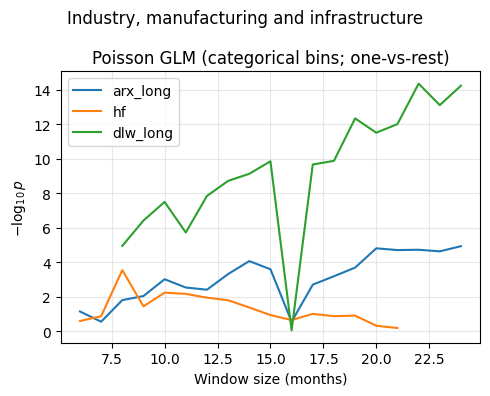

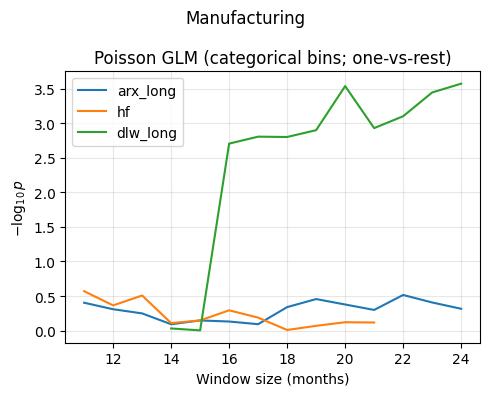

SKIPPING Automotive
SKIPPING Electronics and hardware production
SKIPPING Chemicals and materials
SKIPPING Process industries
SKIPPING Energy
SKIPPING Oil and gas
SKIPPING Electricity
SKIPPING Production
SKIPPING Fossil
SKIPPING Nuclear
SKIPPING Solar
SKIPPING Wind
SKIPPING Hydro
SKIPPING Grid and distribution
SKIPPING Construction and real estate
SKIPPING Architecture and design
SKIPPING Building operations
SKIPPING Real estate management
SKIPPING Transportation and logistics
SKIPPING Shipping and freight
SKIPPING Aviation
SKIPPING Rail
SKIPPING Autonomous vehicles
SKIPPING Data centers and cloud computing
SKIPPING Hyperscale cloud
SKIPPING Enterprise IT
SKIPPING Edge computing


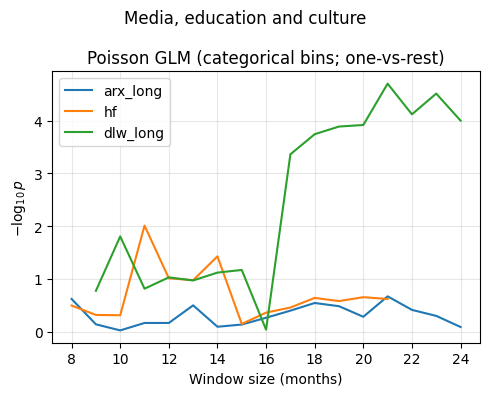

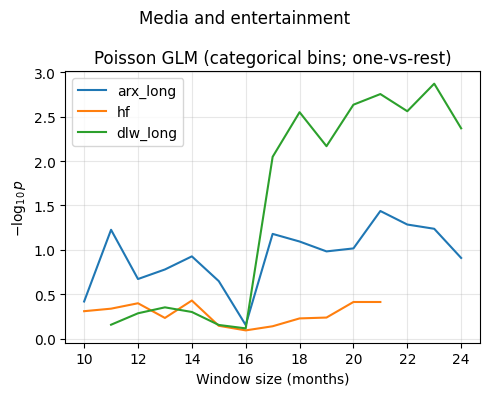

SKIPPING Film and video
SKIPPING Music
SKIPPING Publishing
SKIPPING Games
SKIPPING Education
SKIPPING Schools and universities
SKIPPING Online learning
SKIPPING Tutoring and assessment
SKIPPING Culture and creative industries
SKIPPING Art and design
SKIPPING Fashion
SKIPPING Heritage and museums


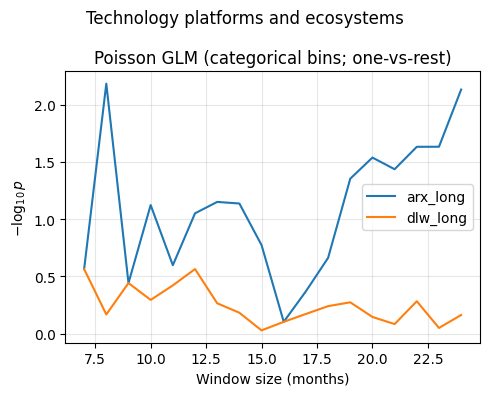

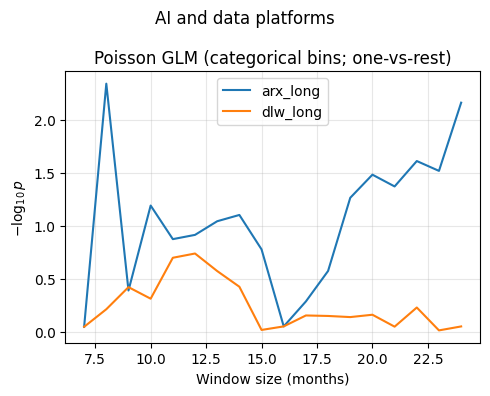

SKIPPING Foundation model providers
SKIPPING Model hosting and inference platforms
SKIPPING Vector databases and embeddings providers
SKIPPING MLOps and LLMOps platforms
SKIPPING Prompt/agent frameworks
SKIPPING Evaluation and observability
SKIPPING Synthetic data and labeling platforms
SKIPPING Feature stores and data platforms
SKIPPING Open source ecosystems
SKIPPING Model hubs and communities
SKIPPING Open model projects
SKIPPING Tooling and libraries
SKIPPING Open research resources
SKIPPING Telecommunications
SKIPPING Network infrastructure
SKIPPING Mobile operators
SKIPPING Satellite communications
SKIPPING Mobile devices and ecosystems
SKIPPING Smartphones
SKIPPING Wearables
SKIPPING IoT devices
SKIPPING Operating systems and platforms
SKIPPING Desktop OS
SKIPPING Mobile OS
SKIPPING Cloud platforms


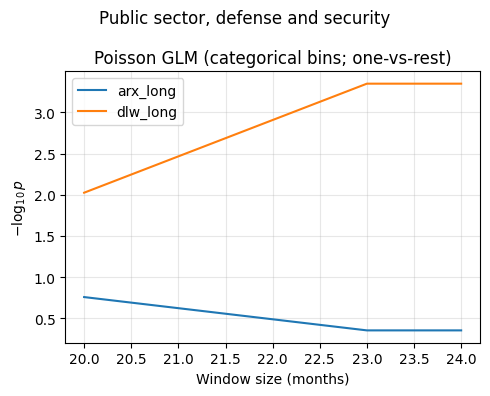

SKIPPING Government
SKIPPING Citizen services
SKIPPING Administration
SKIPPING Smart cities
SKIPPING Defense and aerospace
SKIPPING Military systems
SKIPPING Space exploration
SKIPPING Aerospace engineering
SKIPPING Cybersecurity
SKIPPING Threat detection
SKIPPING Incident response
SKIPPING Infrastructure protection
SKIPPING Agriculture and environment
SKIPPING Agriculture
SKIPPING Crop production
SKIPPING Livestock
SKIPPING Precision agriculture
SKIPPING Environment and sustainability
SKIPPING Climate science
SKIPPING Conservation
SKIPPING Sustainable resource management


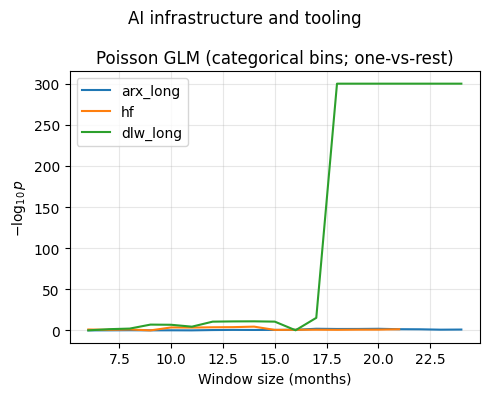

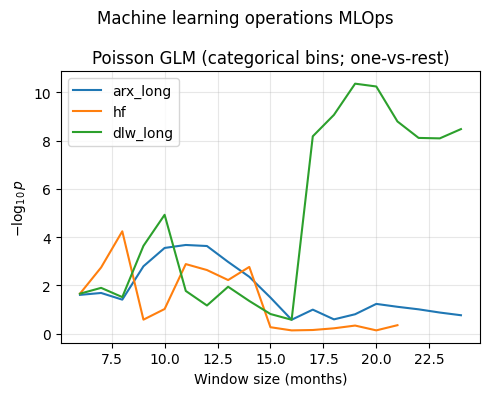

SKIPPING Experiment tracking


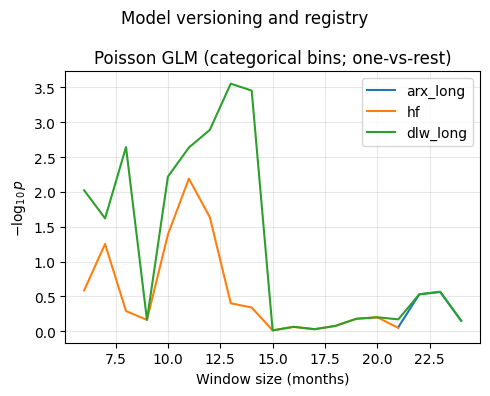

SKIPPING Deployment and serving
SKIPPING Production monitoring (latency, errors, SLOs)
SKIPPING Canary/blue-green rollouts
SKIPPING Incident response and alerting
SKIPPING Drift detection and automated retraining


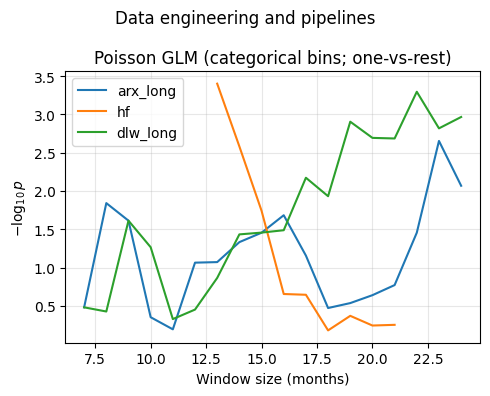

SKIPPING Data collection and labeling
SKIPPING Data validation and quality monitoring
SKIPPING Feature stores and data versioning


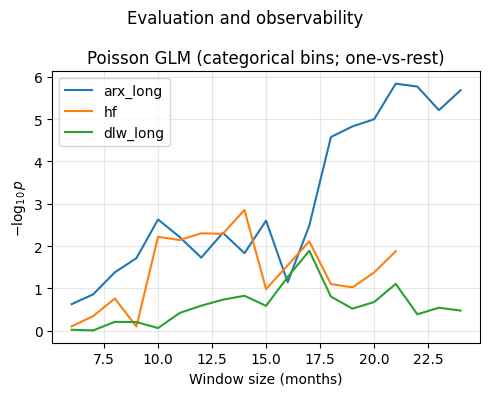

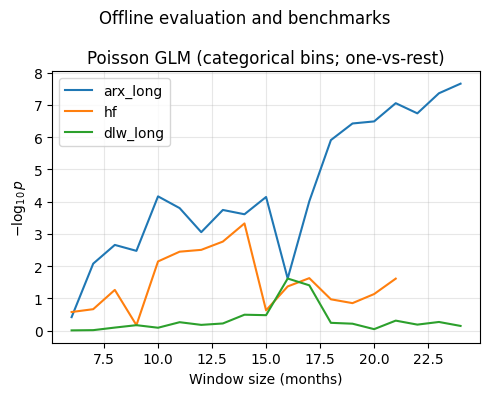

SKIPPING Behavioral/unit tests for prompts and agents
SKIPPING Online evaluation (A/B tests, interleaving)
SKIPPING Tracing and telemetry (requests, tokens, costs)
SKIPPING Performance dashboards and analytics


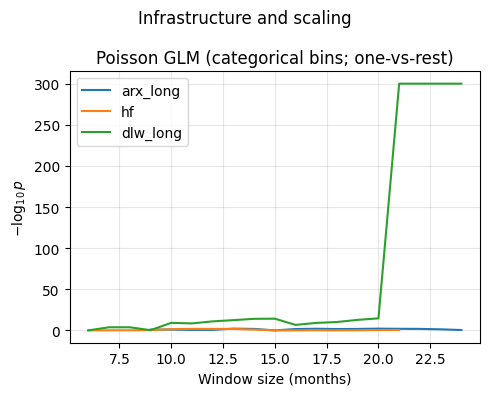

SKIPPING Distributed training


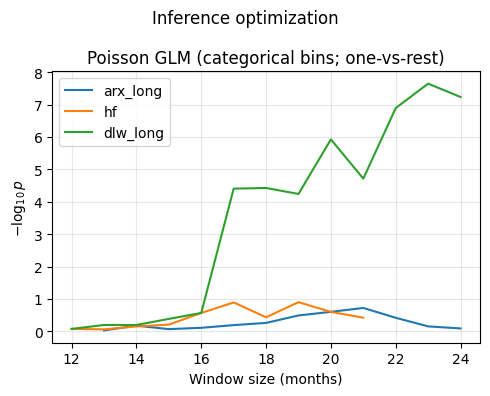

SKIPPING Resource scheduling and autoscaling
SKIPPING Cloud and edge deployment


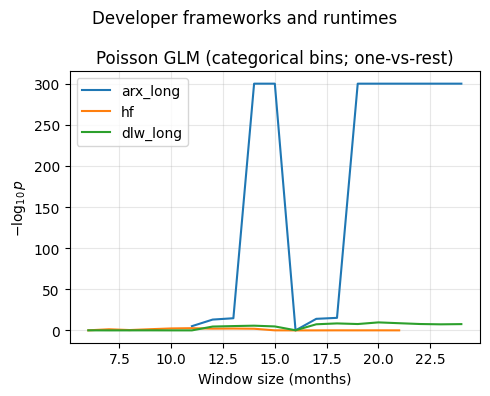

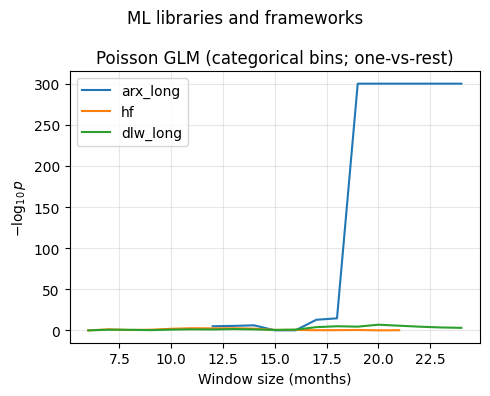

SKIPPING Prompt/agent orchestration frameworks
SKIPPING Simulation and sandbox environments
SKIPPING API and SDK toolkits
SKIPPING Safety and policy
SKIPPING Policy enforcement and guardrails
SKIPPING Safety evaluation and red-teaming
SKIPPING Content moderation
SKIPPING Prompt injection and jailbreak defenses
SKIPPING Toxicity and bias filtering
SKIPPING PII filtering and data loss prevention
SKIPPING Governance and compliance
SKIPPING Model and data provenance/watermarking
SKIPPING Audit logging and traceability
SKIPPING Access control and approval workflows
SKIPPING Risk and compliance assessments (GDPR, HIPAA, etc.)
SKIPPING Privacy-preserving inference (differential privacy, MPC)
SKIPPING Model documentation and reporting (model cards, system cards)


In [19]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_plot(root, plot_uniqueness)

## plot helpful vizualization

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2
from matplotlib.patches import FancyArrowPatch

# -------------------------
# 1) Build dense count series at chosen resolution
# -------------------------

def dense_counts(df, time_col="date", freq="MS"):
    """
    df: rows are documents for one term/topic (one row per occurrence).
    Returns:
      idx: DatetimeIndex at chosen freq (monthly start by default)
      y: counts per period, length=len(idx)
    freq examples:
      "D"  daily
      "W"  weekly (weeks end Sun); try "W-MON" etc.
      "MS" month start
      "QS" quarter start
      "YS" year start
    """
    if len(df) == 0:
        return pd.DatetimeIndex([]), np.array([], dtype=int)

    s = pd.to_datetime(df[time_col])
    start = s.min().to_period(freq).start_time if hasattr(s.min().to_period(freq), "start_time") else s.min()
    end   = s.max().to_period(freq).start_time if hasattr(s.max().to_period(freq), "start_time") else s.max()

    idx = pd.date_range(start=start, end=end, freq=freq)
    # count occurrences per period
    counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)
    return idx, counts.values.astype(int)


# -------------------------
# 2) Disjoint phase binning on dense y
# -------------------------

def bin_counts_with_phase(y, window, phase):
    """
    y: dense counts (length T)
    window: number of base periods per bin
    phase: integer in [0, window-1], shifts the bin start
    Returns counts per complete bin (drops trailing partial bin).
    """
    if len(y) == 0:
        return np.array([], dtype=int)

    ys = y[phase:]
    B = len(ys) // window
    if B <= 0:
        return np.array([], dtype=int)

    trimmed = ys[:B * window]
    return trimmed.reshape(B, window).sum(axis=1)


def chi2_uniform_p(counts):
    """
    Pearson chi-square goodness-of-fit test vs uniform across bins.
    counts: array of bin totals
    Returns X2, df, p, expected (scalar), contribs per bin
    """
    B = len(counts)
    if B < 2:
        return np.nan, 0, np.nan, np.nan, None
    N = counts.sum()
    if N <= 0:
        return np.nan, 0, np.nan, np.nan, None

    expected = N / B
    contribs = (counts - expected) ** 2 / expected
    X2 = contribs.sum()
    df = B - 1
    p = chi2.sf(X2, df)
    return X2, df, p, expected, contribs


# -------------------------
# 3) Find best (window, phase) = lowest p
# -------------------------

def best_window_phase_uniform(y, window_sizes, phases_per_window=5, min_expected=5):
    """
    y: dense counts
    window_sizes: iterable of candidate window sizes in base periods
    phases_per_window: either int (choose evenly spaced phases) or list of phases
    min_expected: require expected count per bin >= this for chi2 approx
    """
    best = None

    for w in window_sizes:
        if w < 1:
            continue

        # choose phase set
        if isinstance(phases_per_window, int):
            K = min(phases_per_window, w)
            phases = np.unique(np.linspace(0, w-1, num=K, dtype=int))
        else:
            phases = [ph for ph in phases_per_window if 0 <= ph < w]

        for ph in phases:
            counts = bin_counts_with_phase(y, w, ph)
            if len(counts) < 2:
                continue
            X2, df, p, expected, contribs = chi2_uniform_p(counts)
            if not np.isfinite(p):
                continue
            if expected < min_expected:
                # this is the "expected per bin" rule for chi-square approximation
                continue

            if (best is None) or (p < best["p"]):
                best = dict(window=w, phase=ph, p=p, X2=X2, df=df,
                            counts=counts, expected=expected, contribs=contribs)

    return best


# -------------------------
# 4) Plot overlay annotations (your sketch)
# -------------------------

def plot_uniform_chi2_explained(
    idx, y,  # dense series
    window, phase,
    ax=None,
    smooth_y=None,            # optional: your smoothed curve to plot instead of raw
    mean_as_rate=False,       # if True, dashed line uses mean per base period; else mean bin total / window
    arrow_scale=6.0,          # controls arrow thickness scaling
    dot_size=25,
    vline_lw=1.2,
):
    """
    Draw:
      - time series (smoothed if provided)
      - red vertical lines at bin boundaries
      - red dashed mean line (expected uniform)
      - red dot for each bin at (center time, bin mean)
      - red arrow from mean to dot, width ∝ chi2 contribution
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))

    # main curve
    y_plot = smooth_y if smooth_y is not None else y
    ax.plot(idx, y_plot, color="black", linewidth=1.5, label="Docs per month")

    # bin totals and chi2 contribs
    counts = bin_counts_with_phase(y, window, phase)
    X2, df, p, expected_bin_total, contribs = chi2_uniform_p(counts)
    B = len(counts)

    # bin boundaries in index coordinates
    # bins cover y[phase : phase + B*window]
    start_i = phase
    end_i = phase + B * window

    # vertical lines at each bin edge
    # edges: start_i, start_i+window, ..., start_i+B*window
    edge_is = [start_i + k * window for k in range(B + 1)]
    edge_is = [i for i in edge_is if 0 <= i < len(idx)]
    for i in edge_is:
        ax.axvline(idx[i], color="blue", linewidth=vline_lw, alpha=0.7)#, label="Bin edges" if i==0 else None)
    ax.scatter([], [], c='blue', marker="|", s=150, label='Bin edges')

    # expected mean line
    # If you want frequency per base period, expected rate = expected_bin_total/window
    expected_rate = expected_bin_total / window
    mean_y = expected_rate if mean_as_rate else expected_rate  # same for base-period series
    ax.axhline(mean_y, color="red", linestyle="--", linewidth=2, alpha=0.7, label="Full mean")

    # per-bin mean (rate) and centers
    # each bin covers [start_i+k*window, start_i+(k+1)*window)
    centers = []
    bin_means = []
    for k in range(B):
        a = start_i + k * window
        b = a + window
        if b > len(y):
            break
        # mean per base period in the bin
        bin_mean = y[a:b].mean()
        # center index
        c = a + (window // 2)
        c = min(c, len(idx) - 1)
        centers.append(idx[c])
        bin_means.append(bin_mean)

    centers = np.array(centers)
    bin_means = np.array(bin_means)

    # dots
    #ax.scatter(centers, bin_means, color="red", s=dot_size, zorder=5)

    # bin mean lines
    for i in range(len(bin_means)):
        if i+1>= len(edge_is):
            break
        ax.plot([idx[edge_is[i]], idx[edge_is[i+1]]], [bin_means[i], bin_means[i]], color = "red", label="Bin mean" if i==0 else None)



    # arrows: linewidth proportional to chi2 contribution in that bin
    # chi2 contrib uses bin totals; arrows use bin mean differences (same direction)
    # normalize contributions to keep visuals stable
    contribs = np.array(contribs[:len(bin_means)])
    if np.all(~np.isfinite(contribs)) or contribs.size == 0:
        contribs = np.zeros_like(bin_means)

    # avoid outliers dominating the plot; use sqrt scaling for aesthetics
    w_raw = np.sqrt(np.clip(contribs, 0, None))**2
    if w_raw.max() > 0:
        w_norm = w_raw / w_raw.max()
    else:
        w_norm = w_raw

    i = 0
    for x, y_bin, w in zip(centers, bin_means, w_norm):
        lw = 0.5 + arrow_scale * w
        # arrow from mean line to dot
        arr = FancyArrowPatch(
            (x, mean_y), (x, y_bin),
            arrowstyle='-|>',
            mutation_scale=12,
            linewidth=lw,
            color="red",
            alpha=0.7,
            zorder=4
        )
        ax.add_patch(arr)
        i+=1

    #ax.set_title(f"Uniformity χ² explanation: window={window}, phase={phase}, p={p:.2e}, X²={X2:.2f}, df={df}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Count per month")
    ax.grid(True, alpha=0.2)


    ax.scatter([], [], c='red', marker=u'$\u2191$', s=150, label='Contribution')

    ax.legend()



    return ax


# -------------------------
# 5) End-to-end convenience wrapper
# -------------------------

def explain_best_uniform_chi2(
    df,
    time_col="date",
    freq="MS",
    window_sizes=range(6, 25),
    phases_per_window=5,
    min_expected=5,
    smooth_fn=None,    # optional: function (idx, y) -> smooth_y
    filename = None,
):
    """
    Finds the (window, phase) with lowest p among tested values, then plots explanation overlay.
    """
    idx, y = dense_counts(df, time_col=time_col, freq=freq)
    if len(y) < 2:
        return None

    best = best_window_phase_uniform(y, window_sizes, phases_per_window=phases_per_window, min_expected=min_expected)
    if best is None:
        return None

    smooth_y = smooth_fn(idx, y) if smooth_fn is not None else None

    fig, ax = plt.subplots(figsize=(8, 4))
    plot_uniform_chi2_explained(
        idx, y,
        window=best["window"],
        phase=best["phase"],
        ax=ax,
        smooth_y=smooth_y
    )
    plt.tight_layout()
    if filename:
        plt.savefig("../../../figs/"+filename+".pdf")

    plt.show()

    return best


In [ ]:
def my_smoother(idx, y):
    # simple example: rolling mean
    return pd.Series(y, index=idx).rolling(3, center=True, min_periods=1).mean().values

#best = explain_best_uniform_chi2(df, smooth_fn=my_smoother)


In [ ]:
cnn_node = root.children[0].children[2].children[1]
rnn_node = root.children[0].children[2].children[2].children[0]
trans_node = root.children[0].children[2].children[2].children[1]
fewshot_node = root.children[2].children[4]
media_node = root.children[3].children[2].children[3].children[0]
arch_node = root.children[0]#.children[2].children[3].children[0].label#
nlp_node = root.children[1].children[1]#children[3].children[0].label


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


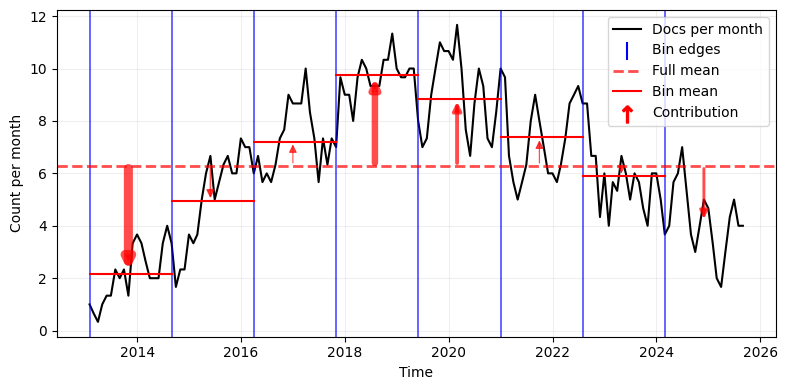

{'window': 19, 'phase': 0, 'p': 1.57907208357569e-25, 'X2': 132.8702928870293, 'df': 7, 'counts': array([ 41,  94, 137, 185, 168, 140, 112,  79]), 'expected': 119.5, 'contribs': array([51.56694561,  5.44142259,  2.56276151, 35.90167364, 19.68410042,
        3.5167364 ,  0.4707113 , 13.72594142])}


In [ ]:
best = explain_best_uniform_chi2(
    df=cnn_node.dfs["arx_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother             # plug your smoothing here (see below)
)
print(best)


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


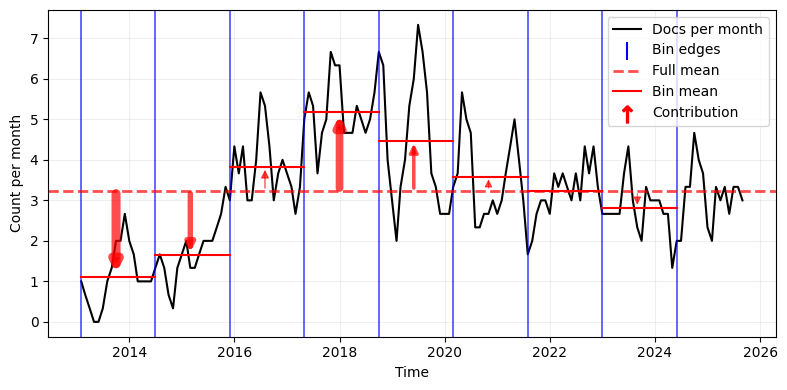

{'window': 17, 'phase': 0, 'p': 3.743277031762498e-12, 'X2': 68.0, 'df': 7, 'counts': array([19, 28, 65, 88, 76, 61, 55, 48]), 'expected': 55.0, 'contribs': array([23.56363636, 13.25454545,  1.81818182, 19.8       ,  8.01818182,
        0.65454545,  0.        ,  0.89090909])}


In [ ]:
best = explain_best_uniform_chi2(
    df=rnn_node.dfs["arx_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother             # plug your smoothing here (see below)
)
print(best)


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


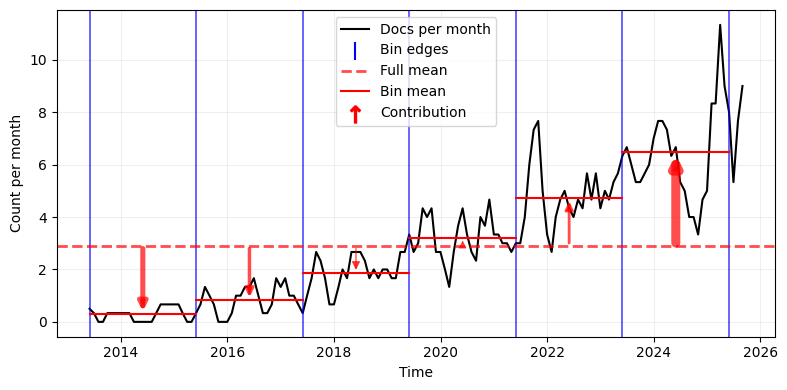

{'window': 24, 'phase': 0, 'p': 8.11216782194284e-49, 'X2': 235.2248803827751, 'df': 5, 'counts': array([  7,  20,  45,  77, 113, 156]), 'expected': 69.66666666666667, 'contribs': array([ 56.37001595,  35.40829346,   8.73365231,   0.77192982,
        26.95374801, 106.98724083])}


In [ ]:
best = explain_best_uniform_chi2(
    df=trans_node.dfs["arx_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother             # plug your smoothing here (see below)
)
print(best)


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


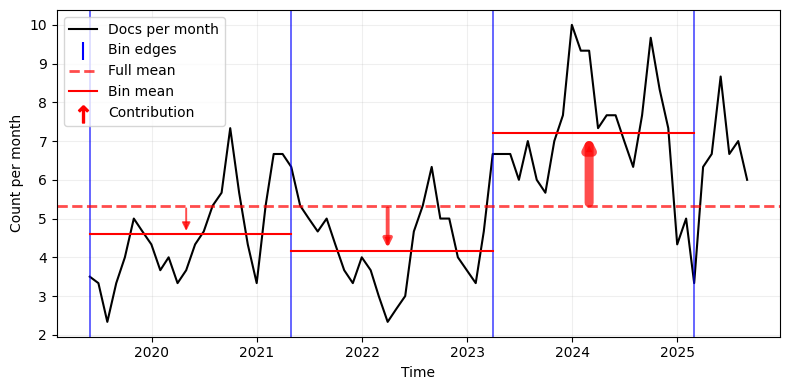

{'window': 23, 'phase': 0, 'p': 8.420994637683779e-06, 'X2': 23.369565217391305, 'df': 2, 'counts': array([106,  96, 166]), 'expected': 122.66666666666667, 'contribs': array([ 2.26449275,  5.79710145, 15.30797101])}


In [ ]:
best = explain_best_uniform_chi2(
    df=trans_node.dfs["dlw_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother             # plug your smoothing here (see below)
)
print(best)


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_81875/3645999073.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


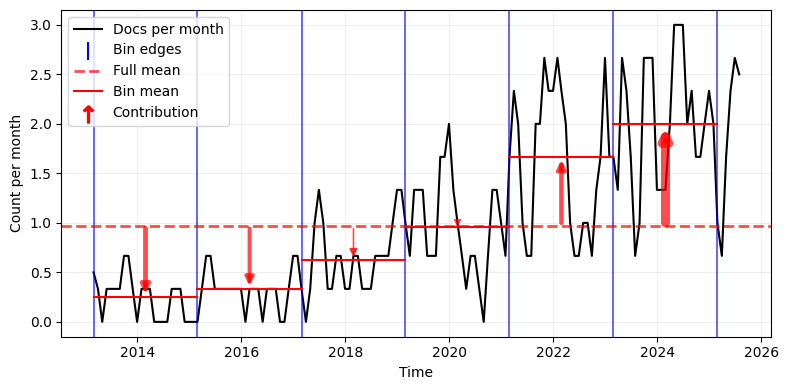

{'window': 24, 'phase': 0, 'p': 1.8820267934034188e-12, 'X2': 63.91428571428571, 'df': 5, 'counts': array([ 6,  8, 15, 23, 40, 48]), 'expected': 23.333333333333332, 'contribs': array([1.28761905e+01, 1.00761905e+01, 2.97619048e+00, 4.76190476e-03,
       1.19047619e+01, 2.60761905e+01])}


In [ ]:
best = explain_best_uniform_chi2(
    df=fewshot_node.dfs["arx_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother,             # plug your smoothing here (see below)
    #filename="fewshow_nonunif_expl"
)
print(best)


/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_51104/3494036976.py:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  idx = pd.date_range(start=start, end=end, freq=freq)
/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_51104/3494036976.py:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  counts = pd.Series(1, index=s).resample(freq).sum().reindex(idx, fill_value=0)


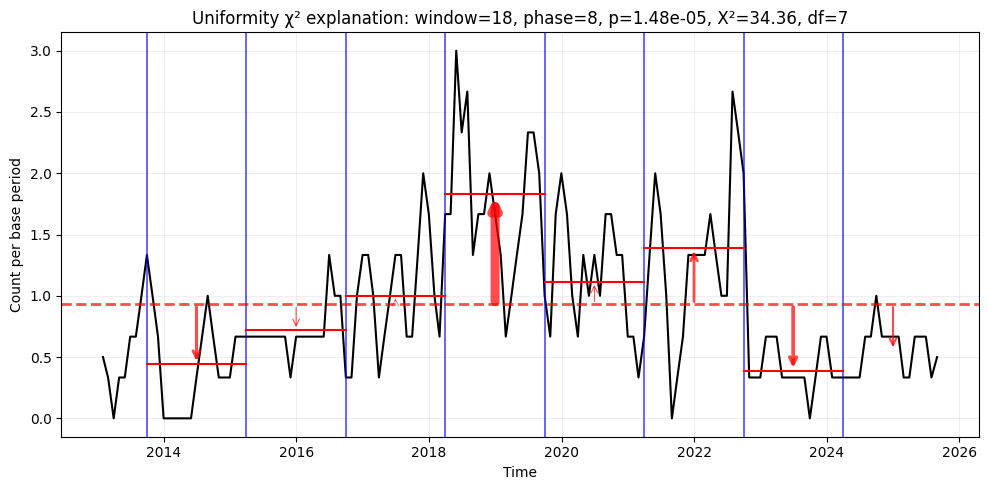

{'window': 18, 'phase': 8, 'p': 1.4759287578462903e-05, 'X2': 34.35820895522388, 'df': 7, 'counts': array([ 8, 13, 18, 33, 20, 25,  7, 10]), 'expected': 16.75, 'contribs': array([ 4.57089552,  0.83955224,  0.09328358, 15.76492537,  0.63059701,
        4.06343284,  5.67537313,  2.72014925])}


In [ ]:
best = explain_best_uniform_chi2(
    df=media_node.dfs["arx_long"],   # or whatever source df you want to illustrate
    time_col="date",
    freq="M",                 # monthly; change to "W" or "D" etc.
    window_sizes=range(6, 25), # windows in units of freq (months here)
    phases_per_window=5,
    min_expected=5,
    smooth_fn=my_smoother             # plug your smoothing here (see below)
)
print(best)


## uniqueness explanation plotting

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf

# -------------------------
# Build dense counts per source at a chosen resolution
# -------------------------

def dense_counts_per_source(node, sources, time_col="date", freq="MS"):
    """
    Returns:
      idx: common DatetimeIndex
      y_by_src: dict {source: np.array counts aligned to idx}
      span_by_src: dict {source: (start_ts, end_ts)} from that source's data
    """
    # find global min/max over all sources to define a common idx
    mins, maxs = [], []
    span_by_src = {}
    for s in sources:
        df = node.dfs.get(s, None)
        if df is None or len(df) == 0:
            continue
        t = pd.to_datetime(df[time_col])
        span_by_src[s] = (t.min(), t.max())
        mins.append(t.min())
        maxs.append(t.max())

    if not mins:
        return pd.DatetimeIndex([]), {}, {}

    start = min(mins)
    end = max(maxs)

    idx = pd.date_range(start=start, end=end, freq=freq)

    y_by_src = {}
    for s in sources:
        df = node.dfs.get(s, None)
        #print(s, len(df))
        if df is None or len(df) == 0:
            continue
        #t = pd.to_datetime(df[time_col])
        t = pd.to_datetime(df[time_col]).dt.floor("D")  # strip time-of-day

        #counts = pd.Series(1, index=t).resample(freq).sum()
        #idx = pd.date_range(counts.index.min(), counts.index.max(), freq=freq)
        #counts = counts.reindex(idx, fill_value=0)
        counts = pd.Series(1, index=t).resample(freq).sum().reindex(idx.floor("D"), fill_value=0)
        #print("resample index head:", counts.index[:5])
        #print("idx head:", idx[:5])
        #print("df head:", df.head(5))
        #print("counts:", counts)
        #print(len(counts))
        y_by_src[s] = counts.values.astype(float)

    return idx, y_by_src, span_by_src


def smooth_series(y, window=5):
    """Simple centered rolling mean; replace with your own smoother if desired."""
    return pd.Series(y).rolling(window, center=True, min_periods=1).mean().values


# -------------------------
# Plot: observed + fitted (full vs reduced) with shading
# -------------------------

def plot_uniqueness_explainer_A(
    node,
    all_sources=("arx_long", "hf", "dlw_long"),
    focal="arx_long",
    time_col="date",
    freq="MS",
    df_s=6,
    smooth_window=5,
    min_total_count=20,
    filename=None,
):
    """
    Fits two Poisson spline models on the overlap between focal and (sum of others):
      Reduced: count ~ C(source) + bs(time, df=df_s, degree=3)
      Full:    count ~ C(source) * bs(time, df=df_s, degree=3)

    Then plots observed smoothed series + fitted curves, and shades the difference
    between focal full vs focal reduced.
    """
    sources = [s for s in all_sources if s in node.dfs and len(node.dfs[s]) > 0]
    if focal not in sources or len(sources) < 2:
        raise ValueError("Need focal + at least one other non-empty source.")

    idx, y_by_src, span_by_src = dense_counts_per_source(node, sources, time_col=time_col, freq=freq)
    if len(idx) == 0:
        raise ValueError("No data to plot.")

    # Define "rest" as sum of other sources
    others = [s for s in sources if s != focal]
    y_focal = y_by_src[focal]
    y_rest = np.zeros_like(y_focal)
    for s in others:
        y_rest += y_by_src[s]

    # Restrict to overlap where focal exists (its span) AND rest exists (union span is fine, but we follow focal span)
    focal_start, focal_end = span_by_src[focal]
    mask = (idx >= focal_start) & (idx <= focal_end)
    idx_ov = idx[mask]
    yA = y_focal[mask]
    yB = y_rest[mask]

    #print(y_by_src)
    #print(focal_start, focal_end)
    #print(yA, yB)

    if (yA.sum() + yB.sum()) < min_total_count:
        raise ValueError("Too few total counts in overlap to fit model.")
    
    # Build long dataframe for GLM
    t = np.arange(len(idx_ov), dtype=float)
    df_long = pd.DataFrame({
        "time": np.concatenate([t, t]),
        "source": (["focal"] * len(t)) + (["rest"] * len(t)),
        "count": np.concatenate([yA, yB])
    })

    # Fit models
    m_red = smf.glm(f"count ~ C(source) + bs(time, df={df_s}, degree=3)",
                    data=df_long, family=sm.families.Poisson()).fit()
    m_full = smf.glm(f"count ~ C(source) * bs(time, df={df_s}, degree=3)",
                     data=df_long, family=sm.families.Poisson()).fit()

    # Predict fitted means for both groups
    pred_grid = pd.DataFrame({
        "time": np.concatenate([t, t]),
        "source": (["focal"] * len(t)) + (["rest"] * len(t))
    })

    pred_red = m_red.predict(pred_grid).to_numpy().reshape(2, len(t))
    pred_full = m_full.predict(pred_grid).to_numpy().reshape(2, len(t))


    red_focal, red_rest = pred_red[0], pred_red[1]
    full_focal, full_rest = pred_full[0], pred_full[1]

    # Smoothed observed
    obs_focal = smooth_series(yA, window=smooth_window)
    obs_rest = smooth_series(yB, window=smooth_window)

    # Plot
    fig, ax = plt.subplots(figsize=(8, 4))

    # Observed (smoothed)
    ax.plot(idx_ov, obs_rest, color="0.6", linewidth=2, label="Observed (rest, smoothed)")
    ax.plot(idx_ov, obs_focal, color="black", linewidth=2, label="Observed (focal, smoothed)")

    # Reduced model (shared spline shape)
    #ax.plot(idx_ov, red_rest, color="0.75", linestyle="--", linewidth=2, label="Reduced fit (rest)")
    ax.plot(idx_ov, red_focal, color="0.4", linestyle="--", linewidth=2, label="Reduced fit (focal)")

    # Full model (source-specific spline shape)
    #ax.plot(idx_ov, full_rest, color="0.85", linestyle="--", linewidth=2, label="Full fit (rest)")
    ax.plot(idx_ov, full_focal, color="red", linestyle="--", linewidth=2, label="Full fit (focal)")

    # Shading: model–data discrepancy (focal)
    ax.fill_between(idx_ov, obs_focal, red_focal,
                    color="0.5", alpha=0.4, label="Error (reduced)")
    ax.fill_between(idx_ov, obs_focal, full_focal,
                    color="red", alpha=0.40, label="Error (full)")
    #ax.fill_between(idx_ov, obs_focal-red_focal, #np.abs(obs_focal-full_focal)),
    #                0, alpha=0.8)  # no-op, ignore; just saying: improvement isn't directly an area



    #ax.set_title(f"Temporal uniqueness explainer (focal={focal}, df_s={df_s})")
    ax.set_xlabel("Time")
    ax.set_ylabel(f"Count per {freq}")
    ax.grid(True, alpha=0.2)
    ax.legend()
    plt.tight_layout()
    if filename:
        plt.savefig("../../../figs/"+filename+".pdf")
    plt.show()

    return dict(
        model_reduced=m_red,
        model_full=m_full,
        idx=idx_ov,
        observed_focal=yA,
        observed_rest=yB,
        pred_reduced_focal=red_focal,
        pred_full_focal=full_focal,
    )


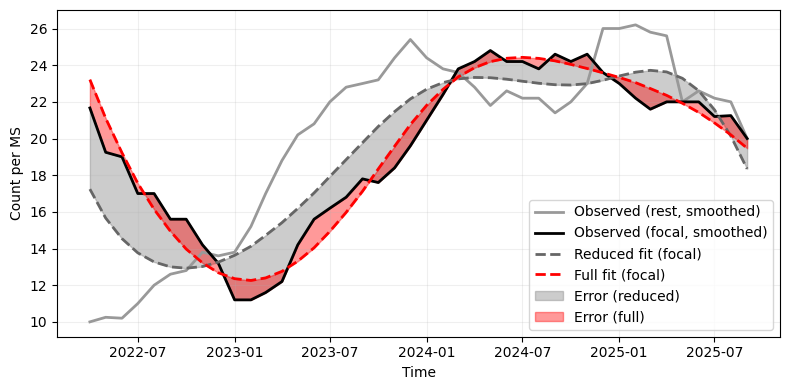

In [ ]:
out = plot_uniqueness_explainer_A(
    nlp_node,
    all_sources=("arx_long", "hf", "dlw_long"),
    focal="hf",
    freq="MS",   # or "W", "D", "YS", etc.
    df_s=6,
    smooth_window=5,
    filename = "nlp_uniq_expl"
)


## print stuff for paper

In [23]:
results_df = pd.DataFrame()
import numpy as np



def print_temporal_scores(node, print_, print_threshold, include_threshold, cap=1e-30):
    #string = ">   "*1*node.depth
    string = "    "*1*max(0, node.depth-1)+"->  "*(node.depth>0)

    if "(" in node.label and ")" in node.label:
        string += node.label.split("(")[0] # remove paranteces to keep the list narrower
    else:
        string += node.label

    current_tab = 44
    spacing = 6
    short_spacing = 3


    string = add_tab(string, current_tab)
    string += "|"

    include_node = False


    # temp sign
    for key in ["arx_long", "hf", "dlw_long"]:
        add_string = ""
        if hasattr(node, "nonuniformity_scores"):
            if key in node.nonuniformity_scores:
                score = node.nonuniformity_scores[key]
                #score = -np.log10(score)
                score = -np.log10(max(score, cap))
                results_df.loc[node.label, key+" temp_sign"] = score
                if score>print_threshold:
                    add_string = str(round(score,1))
                if score>include_threshold:
                    include_node = True
        
        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"
    # temp uniqueness
    for key in ["arx_long", "hf", "dlw_long"]:
        add_string = ""
        if hasattr(node, "temporality_uniqueness_scores"):
            if key in node.temporality_uniqueness_scores:
                score = node.temporality_uniqueness_scores[key]
                #score = -np.log10(score)
                score = -np.log10(max(score, cap))
                results_df.loc[node.label, key+" temp_diff_sign"] = score
                if score>print_threshold:
                    add_string = str(round(score,1))
                if score>include_threshold:
                    include_node = True
        
        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    results_df.loc[node.label, "depth"] = node.depth
    results_df.loc[node.label, "max_depth"] = node.max_depth



    for child in node.children:
        some_child_printed = print_temporal_scores(child, print_=False, print_threshold=print_threshold, include_threshold=include_threshold, cap=cap)
        if some_child_printed:
            include_node = True


    if include_node and print_:
        print(string)
        for child in node.children:
            print_temporal_scores(child, print_=True,print_threshold=print_threshold, include_threshold=include_threshold, cap=cap)


    return include_node


In [24]:
print_temporal_scores(root, True, print_threshold=2, include_threshold=8, cap=1e-10)

AI Taxonomy                                 |                   |                    |
Model architecture                          |                   |                    |
->  Not relevant                            | 10.0              |   4.7   4.4        |
->  Classical machine learning models       | 10.0   3.7        |                    |
    ->  Support vector machines             | 10.0              |                    |
->  Neural/deep learning architectures      | 10.0              |                    |
    ->  Convolutional networks              | 10.0        10.0  |  10.0   4.9  10.0  |
        ->  2D CNNs                         | 10.0         8.6  |   4.9   3.3  10.0  |
        ->  CNN-based GANs                  |              8.5  |   3.0         8.9  |
    ->  Sequence models                     | 10.0              |         3.0        |
        ->  Recurrent neural networks       |  9.6              |                    |
        ->  Transformer architectures      

True

In [25]:
results_df

,arx_long temp_sign,hf temp_sign,dlw_long temp_sign,arx_long temp_diff_sign,hf temp_diff_sign,dlw_long temp_diff_sign,depth,max_depth
AI Taxonomy,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,-1.0,6.0
Model architecture,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,0.0,5.0
Not relevant,4.845549,0.003103,4.675987,3.121209,0.636320,10.0,1.0,1.0
Classical machine learning models,10.000000,3.679777,NaN,1.615845,1.615845,NaN,1.0,2.0
Linear regression,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0
...,...,...,...,...,...,...,...,...
Audit logging and traceability,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
Access control and approval workflows,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
"Risk and compliance assessments (GDPR, HIPAA, etc.)",NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
"Privacy-preserving inference (differential privacy, MPC)",NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0


# count significance

In [ ]:
def count_sign(node, threshold = 0.001):
    count = {}
    diffcount = {}
    #print(node.label)
    #print(node.label, node.temporality_scores)
    for key in ["arx_long", "hf", "dlw_long"]:
        if hasattr(node, "temporality_scores"):
            if key in node.temporality_scores:
                count[key] = int(node.temporality_scores[key] <= threshold)
            else:
                count[key] = 0
        else:
            count = {"arx_long":0, "hf":0, "dlw_long":0}

        if hasattr(node, "temporality_uniqueness_scores"):
            if key in node.temporality_uniqueness_scores:
                diffcount[key] = int(node.temporality_uniqueness_scores[key] <= threshold)
            else:
                diffcount[key] = 0
        else:
            diffcount = {"arx_long":0, "hf":0, "dlw_long":0}

    
    
    for child in node.children:
        count_sign(child, threshold)
        for key in ["arx_long", "hf", "dlw_long"]:
            count[key] += child.sign_count[key]
            diffcount[key] += child.diff_count[key]
    
    node.sign_count = count
    node.diff_count = diffcount





def print_count(node, threshold = 5):
    string = "    "*1*max(0, node.depth-1)+"->  "*(node.depth>0)
    if "(" in node.label and ")" in node.label:
        string += node.label.split("(")[0] # remove paranteces to keep the list narrower
    else:
        string += node.label

    current_tab = 53
    spacing = 6
    short_spacing = 3


    string = add_tab(string, current_tab)
    string += "|"


    
    # sign count:
    sign_counts = []
    for key in ["arx_long", "hf", "dlw_long"]:
        count = node.sign_count[key]
        sign_counts.append(count)
        add_string = str(count)# if node.depth>0 else ""

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    # diff count:
    diff_counts = []
    for key in ["arx_long", "hf", "dlw_long"]:
        count = node.diff_count[key]
        diff_counts.append(count)
        add_string = str(count)# if node.depth>0 else ""

        current_tab+=spacing
        string = add_tab(string, current_tab-len(add_string))
        string += add_string

    current_tab+=short_spacing
    string = add_tab(string, current_tab-1)
    string += "|"

    #if sum(fractions)<15:
    #if max(fractions)<10:
    #    return
    if (sum(sign_counts) + sum(diff_counts)) < threshold:
        return
    
    print(string)
    for child in node.children:
        print_count(child, threshold)


    
count_sign(root)
#print_count(root)


In [ ]:
print_count(root)


AI Taxonomy                                          |   41    12    23  |    30    24    39  |
Model architecture                                   |   16     1     4  |     8     8     8  |
->  Neural/deep learning architectures               |   13     0     4  |     7     7     8  |
    ->  Convolutional networks                       |    4     0     3  |     3     2     4  |
        ->  2D CNNs                                  |    1     0     1  |     1     1     1  |
    ->  Sequence models                              |    5     0     1  |     2     3     3  |
        ->  Transformer architectures                |    3     0     1  |     2     3     3  |
AI problem type                                      |   13     7    11  |     9     9    11  |
->  Natural language processing                      |    4     3     5  |     3     5     3  |
    ->  Question answering                           |    1     0     1  |     1     1     1  |
->  Computer vision                     

In [ ]:
count_sign(root, 1e-3)
print_count(root, 30)

AI Taxonomy                                          |   41    12    23  |    30    24    39  |
Model architecture                                   |   16     1     4  |     8     8     8  |
->  Neural/deep learning architectures               |   13     0     4  |     7     7     8  |
AI problem type                                      |   13     7    11  |     9     9    11  |
Learning paradigm                                    |   11     3     4  |     6     2     8  |
Application domain                                   |    1     1     4  |     7     5    12  |


In [ ]:
count_sign(root, 1e-4)
print_count(root, 50)


AI Taxonomy                                          |   31     9    17  |    21    18    34  |


In [ ]:
count_sign(root, 1e-5)
print_count(root, 50)


AI Taxonomy                                          |   25     7    10  |    13    13    32  |


In [ ]:
count_sign(root, 1e-1)
print_count(root, 200)

count_sign(root, 1e-2)
print_count(root, 100)

count_sign(root, 1e-3)
print_count(root, 70)

count_sign(root, 1e-4)
print_count(root, 50)

count_sign(root, 1e-6)
print_count(root, 40)

count_sign(root, 1e-8)
print_count(root, 40)

count_sign(root, 1e-10)
print_count(root, 40)



AI Taxonomy                                          |   76    42    56  |    65    48    76  |
AI Taxonomy                                          |   53    23    36  |    40    32    52  |
AI Taxonomy                                          |   41    12    23  |    30    24    39  |
AI Taxonomy                                          |   31     9    17  |    21    18    34  |
AI Taxonomy                                          |   23     7    10  |    11    11    25  |
AI Taxonomy                                          |   16     5     7  |     6     7    20  |
AI Taxonomy                                          |   11     4     4  |     6     4    16  |
